In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [2]:
# make data
x = np.array(range(-100,100))/10.*np.pi
y = 5*np.sin(x/10)
eps_homo = np.random.normal(y)
eps_hetero = np.random.normal(y) * np.abs(y)
y_homo = y + eps_homo
y_hetero = y + eps_hetero

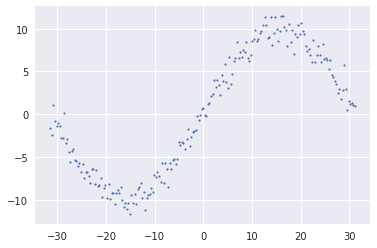

In [3]:
# Homoscedastic aleatoric error
plt.scatter(x,y_homo, s=3)
plt.show()

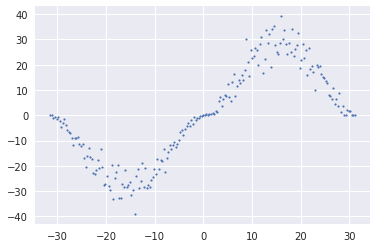

In [4]:
# Heteroscedastic aleatoric error
plt.scatter(x,y_hetero, s=3)
plt.show()

In [9]:
hidden_size = 30

class Net(nn.Module):
    def __init__(self, ):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(1, hidden_size)
        self.fc1.weight.data.normal_(0, 0.1)   # initialization
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.fc2.weight.data.normal_(0, 0.1)   # initialization
        self.out = nn.Linear(hidden_size, 1)
        self.out.weight.data.normal_(0, 0.1)   # initialization
        self.uncertain = nn.Linear(hidden_size, 1)
        self.uncertain.weight.data.normal_(0, 0.1)   # initialization

    def forward(self, x, training):
        x = F.dropout(F.relu(self.fc1(x)), training=training)
        x = F.dropout(F.relu(self.fc2(x)), training=training)
        out = self.out(x)
        uncertain = self.uncertain(x)
            
        return out, uncertain

/home/sungyub/.conda/envs/pytorch/lib/python3.6/site-packages/ipykernel_launcher.py:22: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


0 th loss :tensor(61.2760)


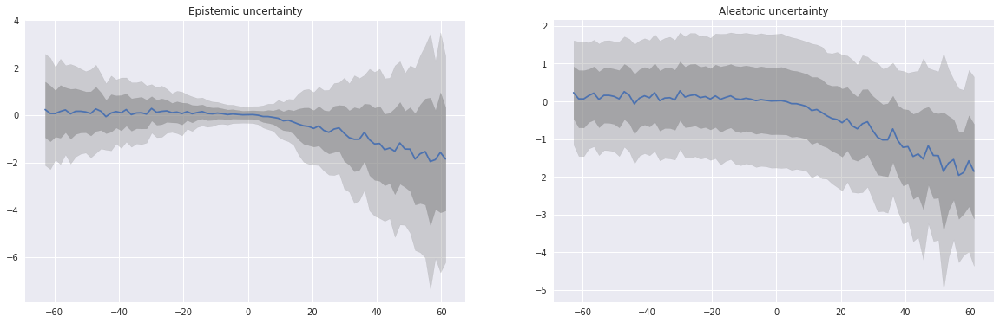

10000 th loss :tensor(10.0255)


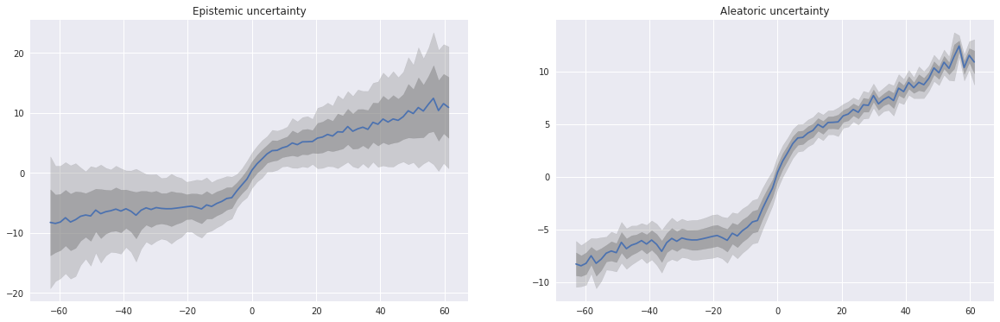

20000 th loss :tensor(13.9458)


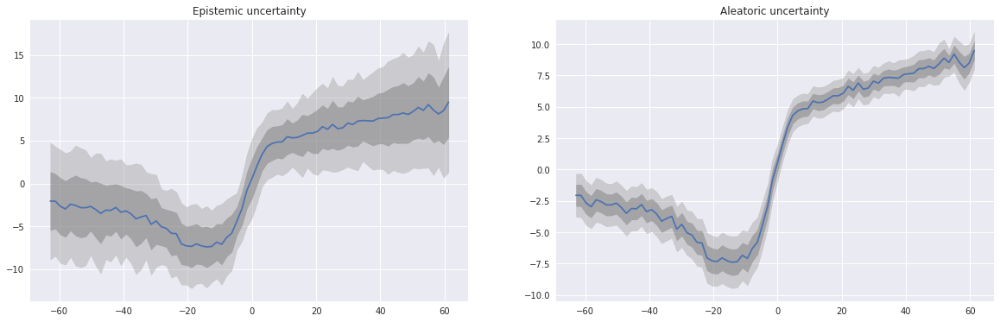

30000 th loss :tensor(6.2019)


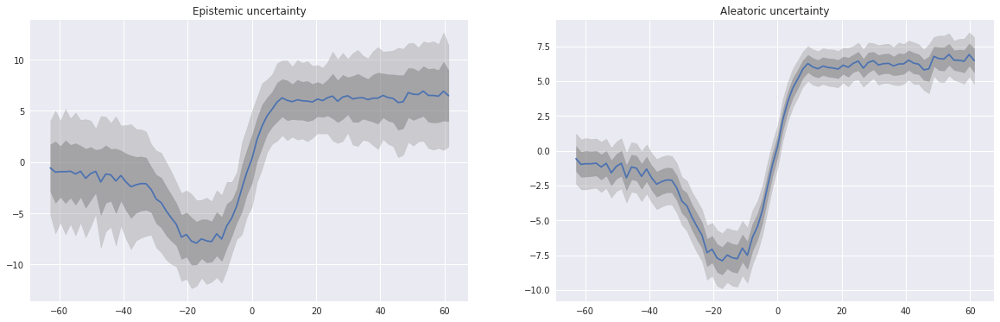

40000 th loss :tensor(11.2150)


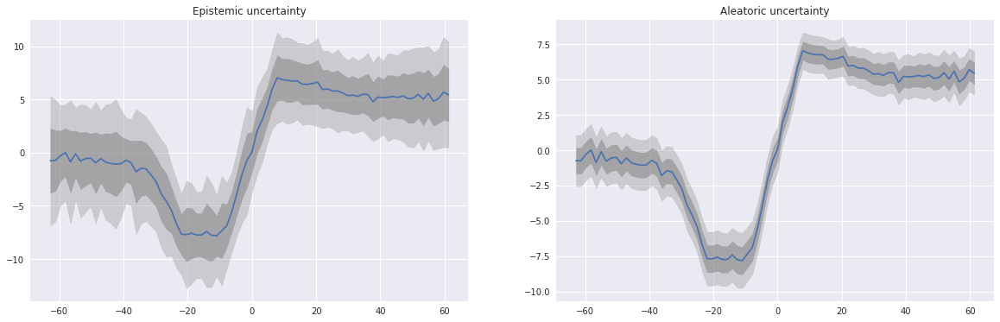

50000 th loss :tensor(7.4826)


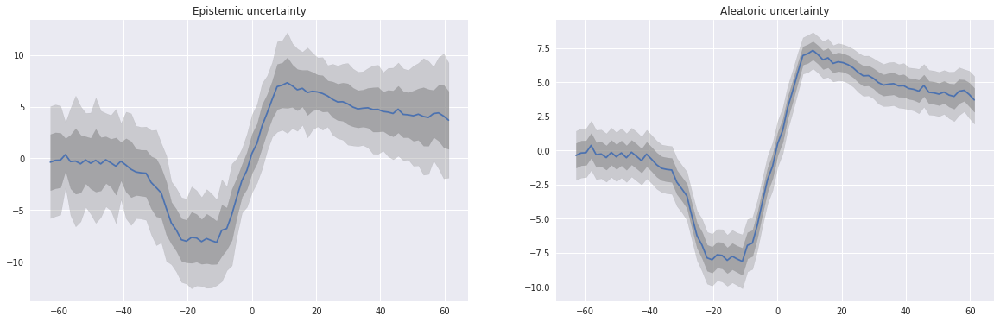

60000 th loss :tensor(3.7275)


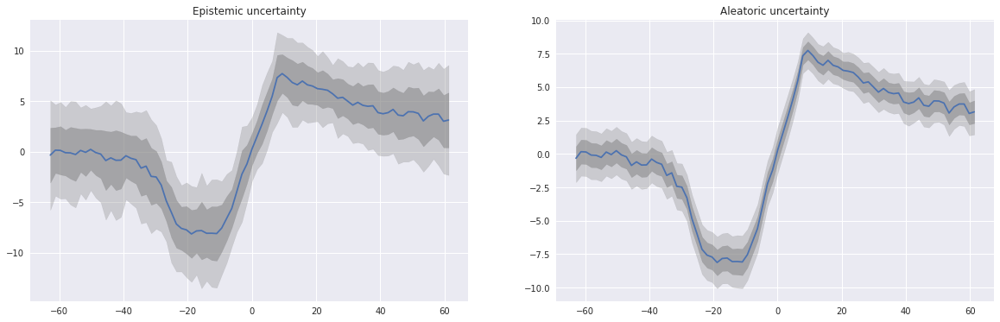

70000 th loss :tensor(6.9465)


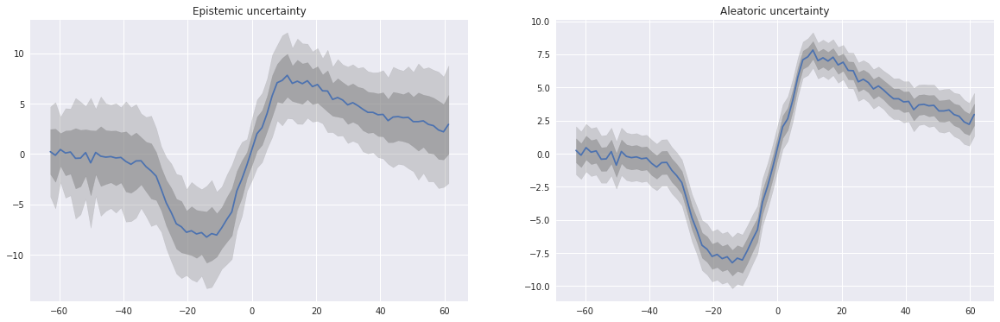

80000 th loss :tensor(8.2038)


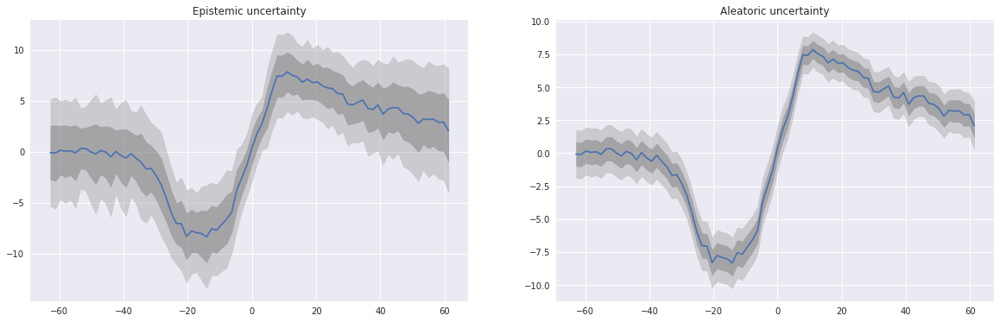

90000 th loss :tensor(6.3456)


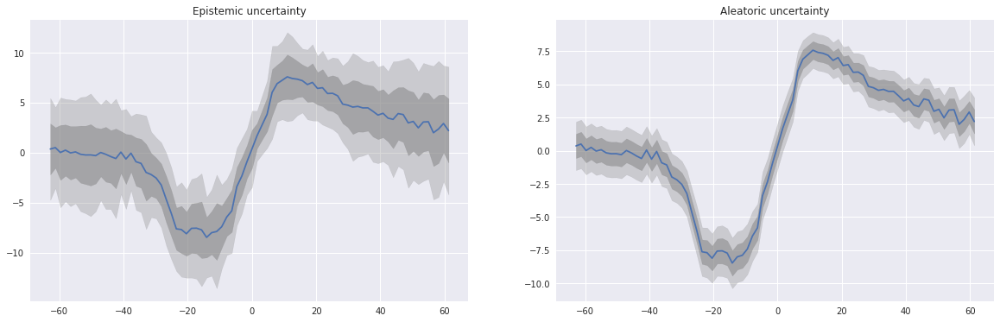

100000 th loss :tensor(6.0912)


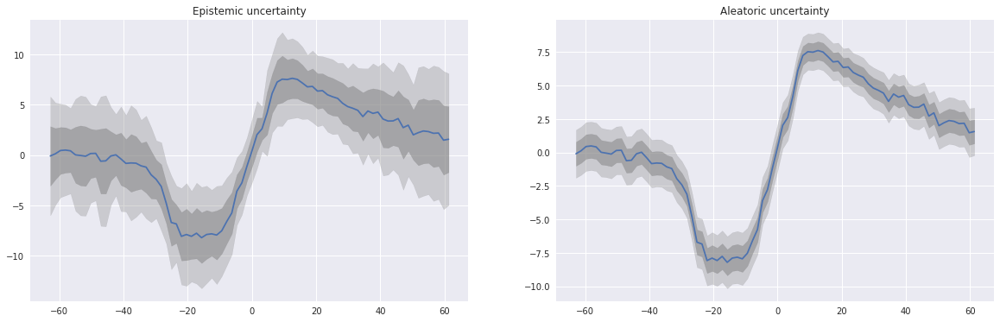

110000 th loss :tensor(9.7597)


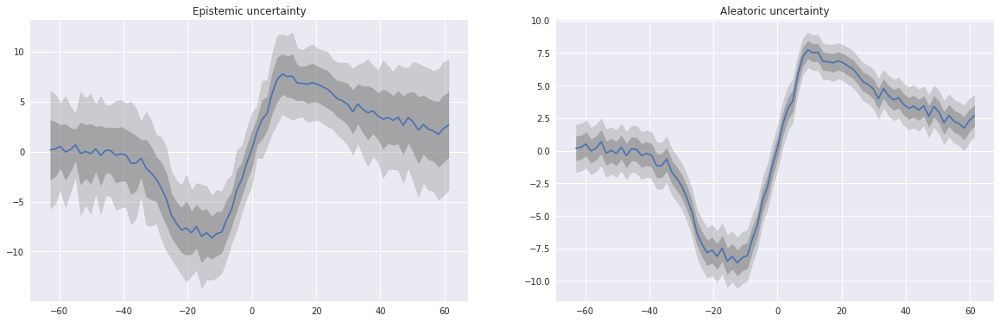

120000 th loss :tensor(9.4697)


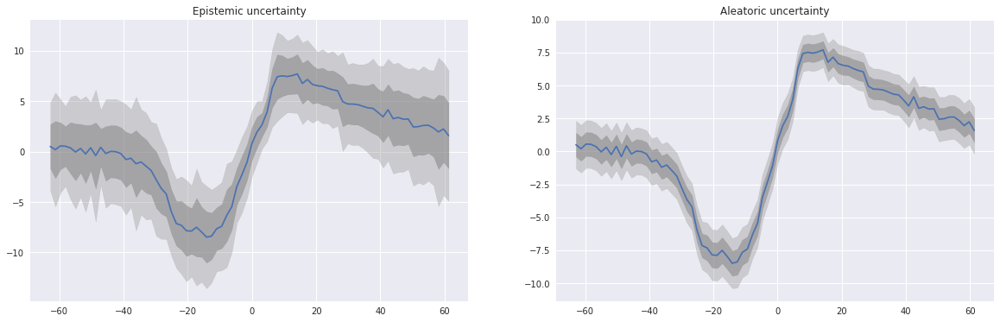

130000 th loss :tensor(6.7294)


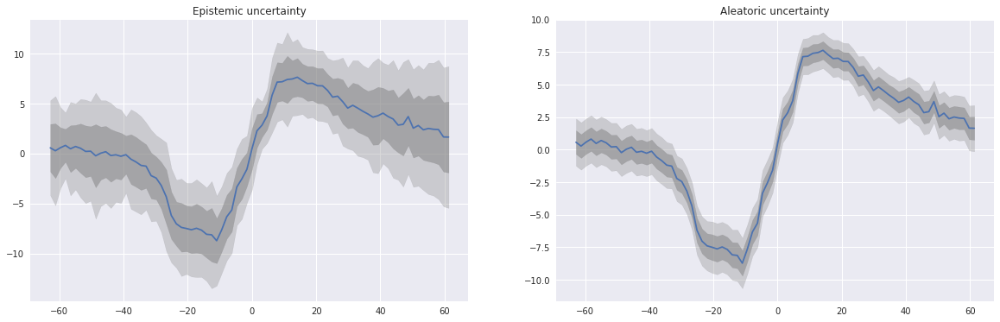

140000 th loss :tensor(7.0827)


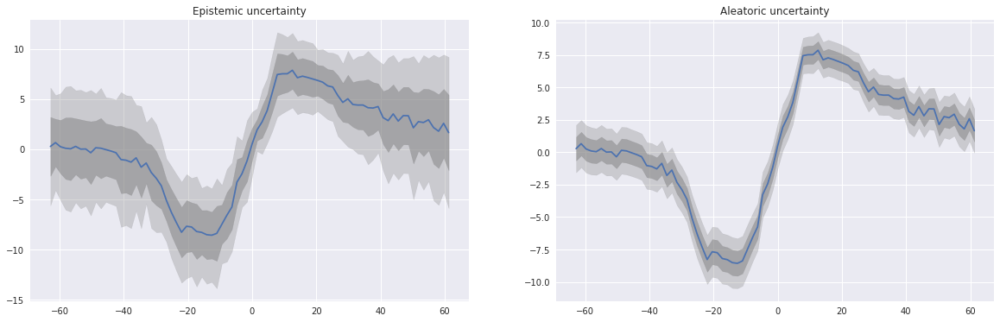

150000 th loss :tensor(3.0239)


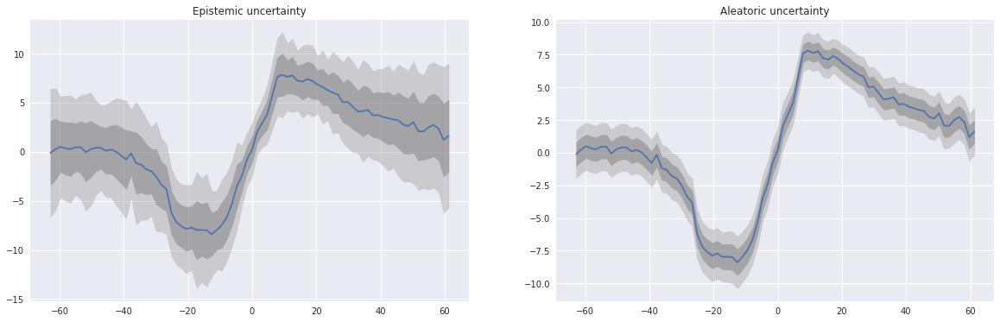

160000 th loss :tensor(6.9897)


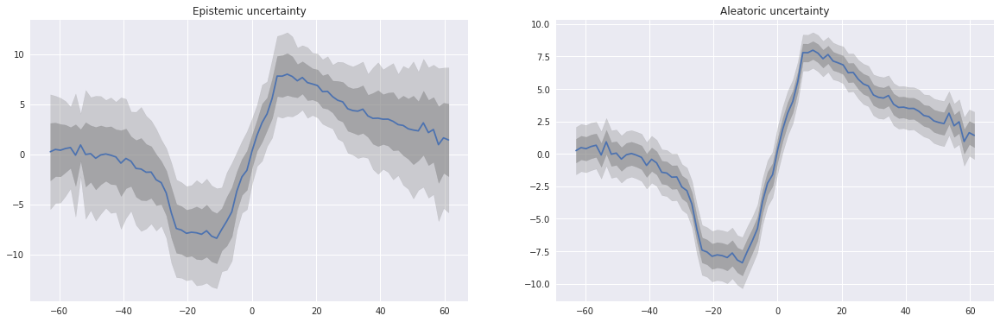

170000 th loss :tensor(3.4497)


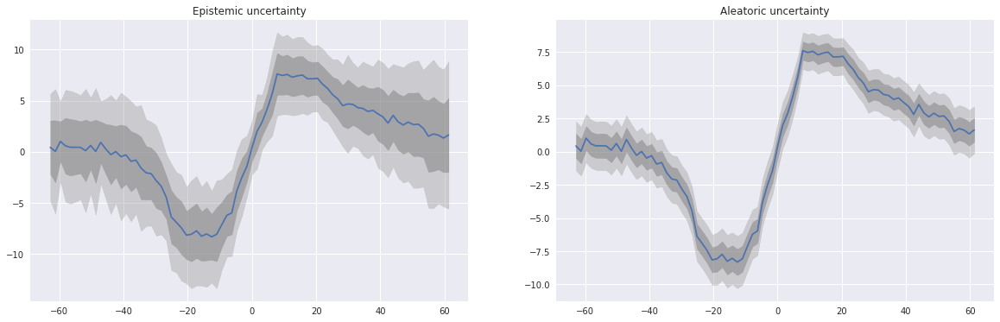

180000 th loss :tensor(5.0165)


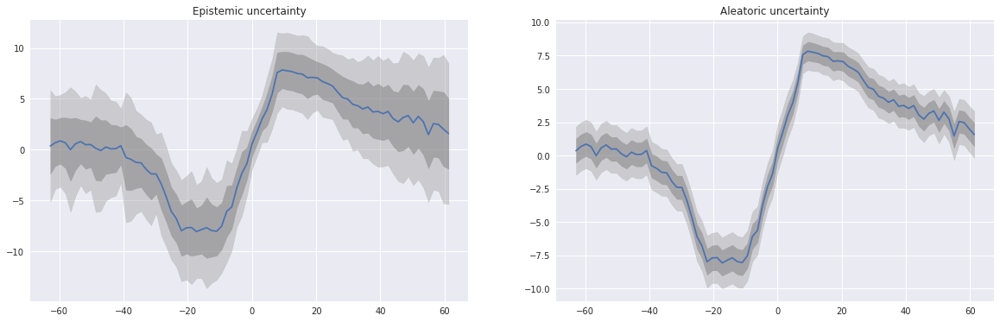

190000 th loss :tensor(8.6599)


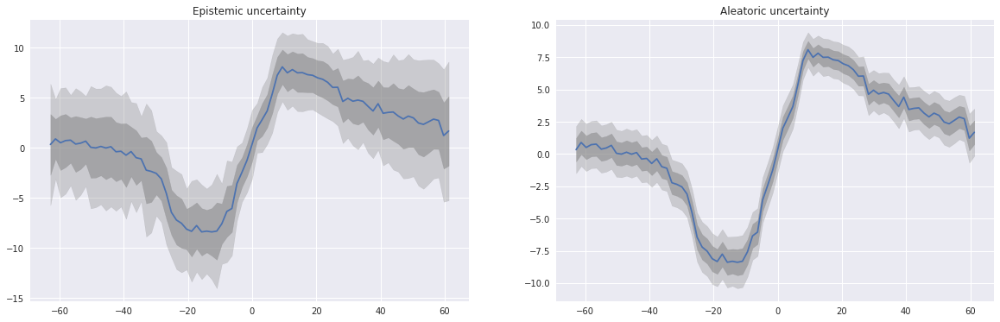

200000 th loss :tensor(8.1887)


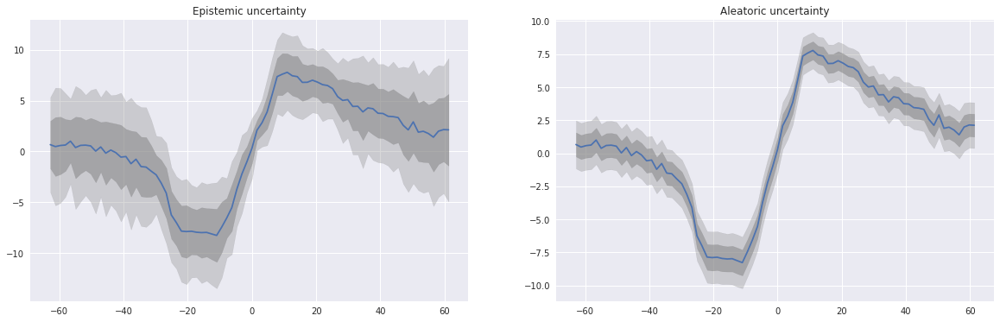

210000 th loss :tensor(5.0335)


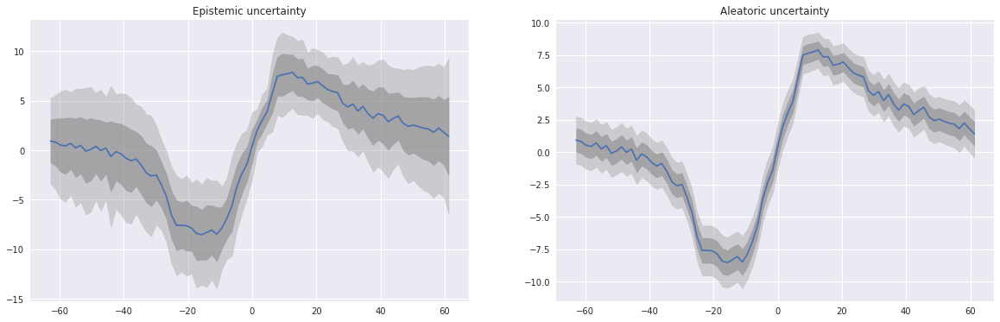

220000 th loss :tensor(5.5397)


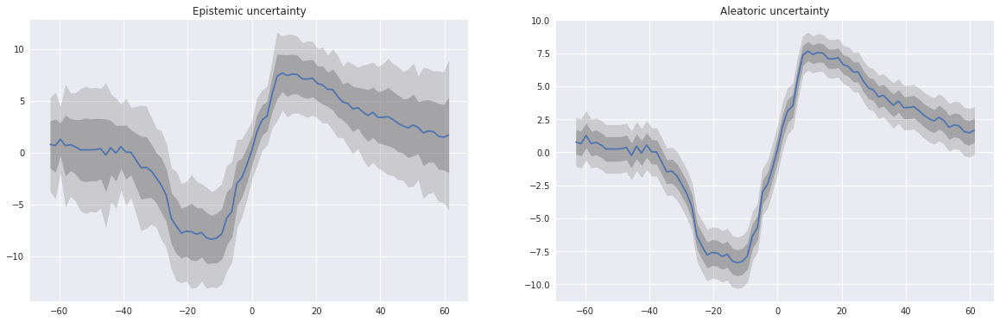

230000 th loss :tensor(6.9657)


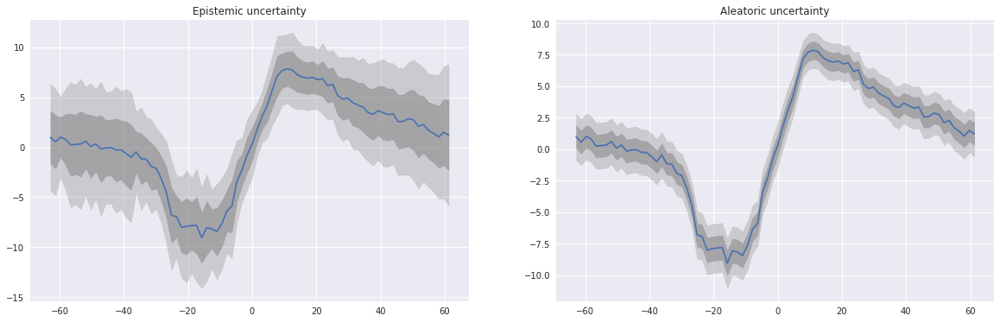

240000 th loss :tensor(9.5111)


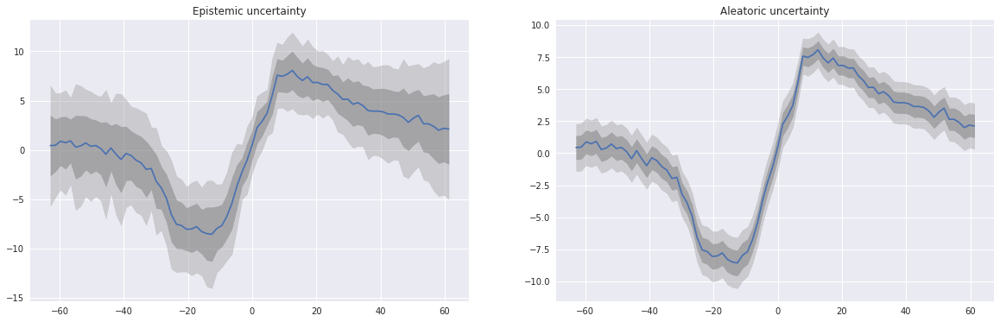

250000 th loss :tensor(6.2914)


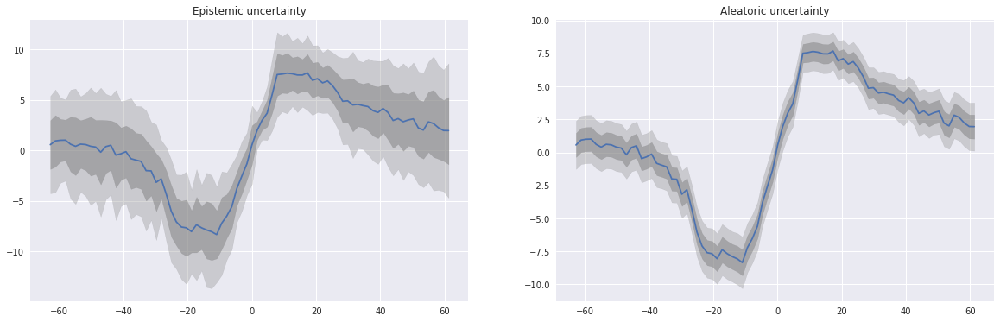

260000 th loss :tensor(5.7721)


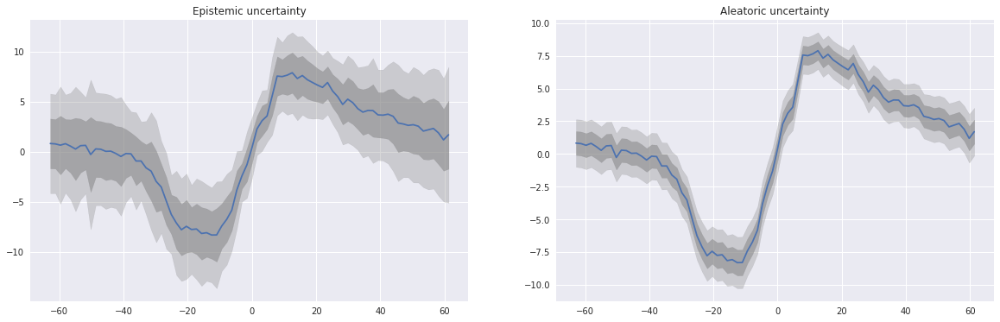

270000 th loss :tensor(5.6729)


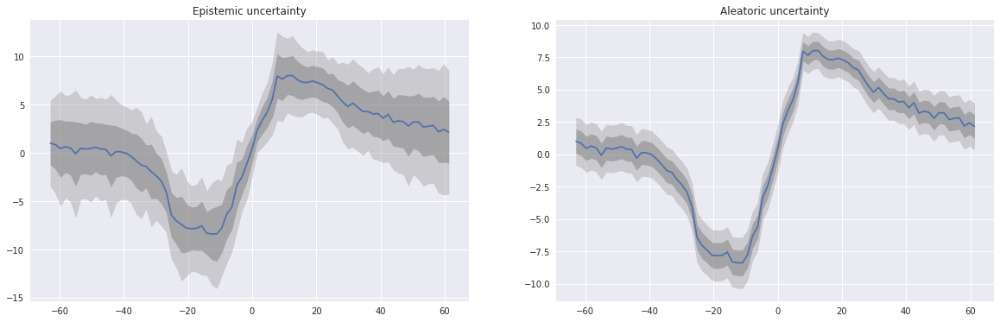

280000 th loss :tensor(3.3055)


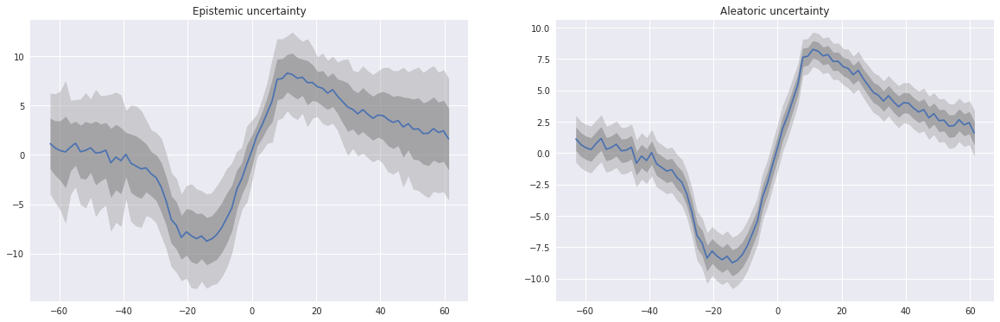

KeyboardInterrupt: 

In [10]:
# Homoscedastic data fitting with only MC dropout
MCD_net = Net().cuda()
MCD_opt = torch.optim.Adam(MCD_net.parameters(),lr=1e-4)
MCD_loss_func = nn.MSELoss(reduce=False)

MCD_net.train()
for _ in range(10**6):
    # Sample the data with replacement
    index = np.random.choice(range(len(x)),size = 2**4)
    x_chosen = Variable(torch.FloatTensor(x[index]).view(-1,1)).cuda()
    y_chosen = Variable(torch.FloatTensor(y_homo[index]).view(-1,1)).cuda()
    
    # Prdict and calculate the loss
    y_predict, y_uncertain = MCD_net.forward(x_chosen, training = True)
    loss = MCD_loss_func(y_predict, y_chosen).mean()
    
    MCD_opt.zero_grad()
    loss.backward()
    MCD_opt.step()
    
    if (_%10**4) == 0:
        print(str(_)+' th loss :'+ str(loss.cpu().data[0]))
        
        x_test = np.array(range(-40,40))/2.*np.pi
        x_chosen = Variable(torch.FloatTensor(x_test).view(-1,1)).cuda()
        y_pred = np.zeros((100, 80,1))
        y_uncert = np.zeros((100, 80,1))

        for i in range(100):
            y_predict, y_uncertain = MCD_net.forward(x_chosen, training = True)
            y_pred[i] = y_predict.cpu().data
            y_uncert[i] = y_uncertain.cpu().data

        y_pred_mean = y_pred.mean(axis = 0)
        y_pred_std = y_pred.std(axis = 0)
        y_uncert = np.sqrt(np.mean(np.exp(y_uncert), axis =0))
        
        f, (ax1, ax2) = plt.subplots(1, 2,figsize=(20,6))
        ax1.plot(x_test, y_pred_mean)
        ax1.fill_between(x_test, y_pred_mean.reshape(-1) - y_pred_std.reshape(-1), 
                         y_pred_mean.reshape(-1) + y_pred_std.reshape(-1),color='gray', alpha=0.5)
        ax1.fill_between(x_test, y_pred_mean.reshape(-1) - 2*y_pred_std.reshape(-1), 
                         y_pred_mean.reshape(-1) + 2*y_pred_std.reshape(-1),color='gray', alpha=0.3)
        ax2.plot(x_test, y_pred_mean)
        ax2.fill_between(x_test, y_pred_mean.reshape(-1) - y_uncert.reshape(-1), 
                         y_pred_mean.reshape(-1) +y_uncert.reshape(-1),color='gray', alpha=0.5)
        ax2.fill_between(x_test, y_pred_mean.reshape(-1) - 2*y_uncert.reshape(-1), 
                         y_pred_mean.reshape(-1) + 2*y_uncert.reshape(-1),color='gray', alpha=0.3)
        ax1.set_title('Epistemic uncertainty')
        ax2.set_title('Aleatoric uncertainty')
        plt.show()

In [ ]:
# Heteroscedastic data fitting with only MC dropout
MCD_net = Net().cuda()
MCD_opt = torch.optim.Adam(MCD_net.parameters(),lr=1e-4)
MCD_loss_func = nn.MSELoss(reduce=False)

MCD_net.train()
for _ in range(10**6):
    # Sample the data with replacement
    index = np.random.choice(range(len(x)),size = 2**4)
    x_chosen = Variable(torch.FloatTensor(x[index]).view(-1,1)).cuda()
    y_chosen = Variable(torch.FloatTensor(y_hetero[index]).view(-1,1)).cuda()
    
    # Prdict and calculate the loss
    y_predict, y_uncertain = MCD_net.forward(x_chosen, training = True)
    loss = MCD_loss_func(y_predict, y_chosen).mean()
    
    MCD_opt.zero_grad()
    loss.backward()
    MCD_opt.step()
    
    if (_%10**4) == 0:
        print(str(_)+' th loss :'+ str(loss.cpu().data[0]))
        
        x_test = np.array(range(-40,40))/2.*np.pi
        x_chosen = Variable(torch.FloatTensor(x_test).view(-1,1)).cuda()
        y_pred = np.zeros((100, 80,1))
        y_uncert = np.zeros((100, 80,1))

        for i in range(100):
            y_predict, y_uncertain = MCD_net.forward(x_chosen, training = True)
            y_pred[i] = y_predict.cpu().data
            y_uncert[i] = y_uncertain.cpu().data

        y_pred_mean = y_pred.mean(axis = 0)
        y_pred_std = y_pred.std(axis = 0)
        y_uncert = np.sqrt(np.mean(np.exp(y_uncert), axis =0))
        
        f, (ax1, ax2) = plt.subplots(1, 2,figsize=(20,6))
        ax1.plot(x_test, y_pred_mean)
        ax1.fill_between(x_test, y_pred_mean.reshape(-1) - y_pred_std.reshape(-1), 
                         y_pred_mean.reshape(-1) + y_pred_std.reshape(-1),color='gray', alpha=0.5)
        ax1.fill_between(x_test, y_pred_mean.reshape(-1) - 2*y_pred_std.reshape(-1), 
                         y_pred_mean.reshape(-1) + 2*y_pred_std.reshape(-1),color='gray', alpha=0.3)
        ax2.plot(x_test, y_pred_mean)
        ax2.fill_between(x_test, y_pred_mean.reshape(-1) - y_uncert.reshape(-1), 
                         y_pred_mean.reshape(-1) +y_uncert.reshape(-1),color='gray', alpha=0.5)
        ax2.fill_between(x_test, y_pred_mean.reshape(-1) - 2*y_uncert.reshape(-1), 
                         y_pred_mean.reshape(-1) + 2*y_uncert.reshape(-1),color='gray', alpha=0.3)
        ax1.set_title('Epistemic uncertainty')
        ax2.set_title('Aleatoric uncertainty')
        plt.show()

In [ ]:
# Homoscedastic data fitting with both MC dropout and estimate aleatoric uncertainty
hybrid_net = Net().cuda()
hybrid_opt = torch.optim.Adam(hybrid_net.parameters(),lr=1e-4)
hybrid_loss_func = nn.MSELoss(reduce=False)

for _ in range(10**6):
    # Sample the data with replacement
    index = np.random.choice(range(len(x)),size = 2**4)
    x_chosen = Variable(torch.FloatTensor(x[index]).view(-1,1)).cuda()
    y_chosen = Variable(torch.FloatTensor(y_homo[index])).cuda()
    
    # Prdict and calculate the loss
    y_predict, y_uncertain = hybrid_net.forward(x_chosen, training = True)
    loss =((torch.exp(-y_uncertain)*hybrid_loss_func(y_predict, y_chosen) )+ y_uncertain).sum()
    loss_to_show = hybrid_loss_func(y_predict, y_chosen).mean()
    
    hybrid_opt.zero_grad()
    loss.backward()
    hybrid_opt.step()
    
    if (_%10**4) == 0:
        print(str(_)+' th loss :'+ str(loss_to_show.cpu().data[0]))
        
        x_test = np.array(range(-40,40))/2.*np.pi
        x_chosen = Variable(torch.FloatTensor(x_test).view(-1,1)).cuda()
        y_pred = np.zeros((100, 80,1))
        y_uncert = np.zeros((100, 80,1))

        for i in range(100):
            y_predict, y_uncertain = hybrid_net.forward(x_chosen, training = True)
            y_pred[i] = y_predict.cpu().data
            y_uncert[i] = y_uncertain.cpu().data

        y_pred_mean = y_pred.mean(axis = 0)
        y_pred_std = y_pred.std(axis = 0)
        y_uncert = np.sqrt(np.mean(np.exp(y_uncert), axis =0))
        
        f, (ax1, ax2) = plt.subplots(1, 2,figsize=(20,6))
        ax1.plot(x_test, y_pred_mean)
        ax1.fill_between(x_test, y_pred_mean.reshape(-1) - y_pred_std.reshape(-1), 
                         y_pred_mean.reshape(-1) + y_pred_std.reshape(-1),color='gray', alpha=0.5)
        ax1.fill_between(x_test, y_pred_mean.reshape(-1) - 2*y_pred_std.reshape(-1), 
                         y_pred_mean.reshape(-1) + 2*y_pred_std.reshape(-1),color='gray', alpha=0.3)
        ax2.plot(x_test, y_pred_mean)
        ax2.fill_between(x_test, y_pred_mean.reshape(-1) - y_uncert.reshape(-1), 
                         y_pred_mean.reshape(-1) +y_uncert.reshape(-1),color='gray', alpha=0.5)
        ax2.fill_between(x_test, y_pred_mean.reshape(-1) - 2*y_uncert.reshape(-1), 
                         y_pred_mean.reshape(-1) + 2*y_uncert.reshape(-1),color='gray', alpha=0.3)
        ax1.set_title('Epistemic uncertainty')
        ax2.set_title('Aleatoric uncertainty')
        plt.show()

/home/sungyub/.conda/envs/pytorch/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


0 th loss :tensor(224.2579)


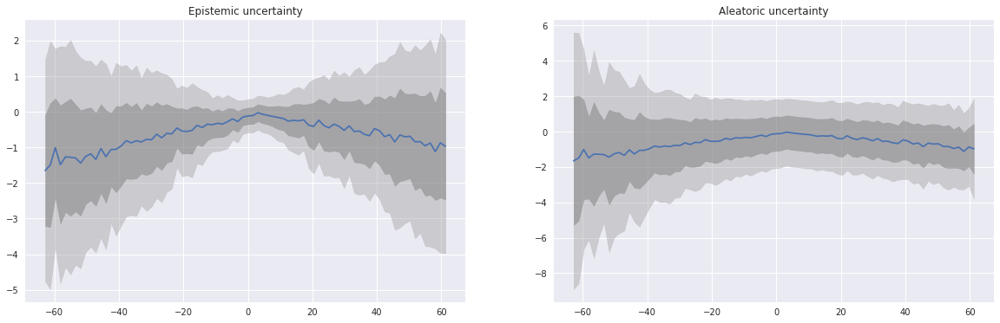

10000 th loss :tensor(288.7752)


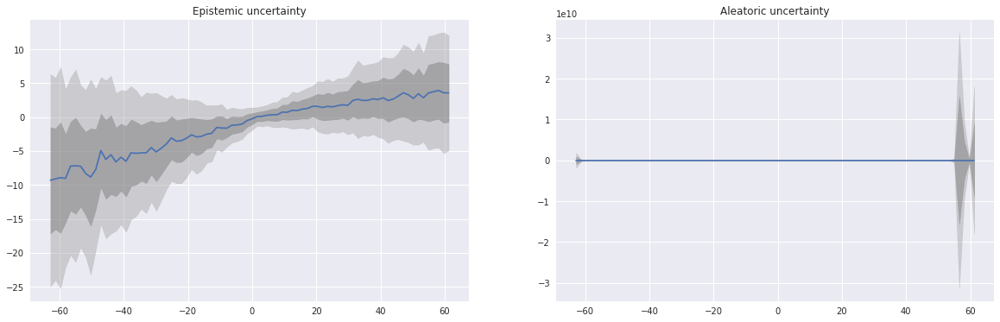

20000 th loss :tensor(266.7989)


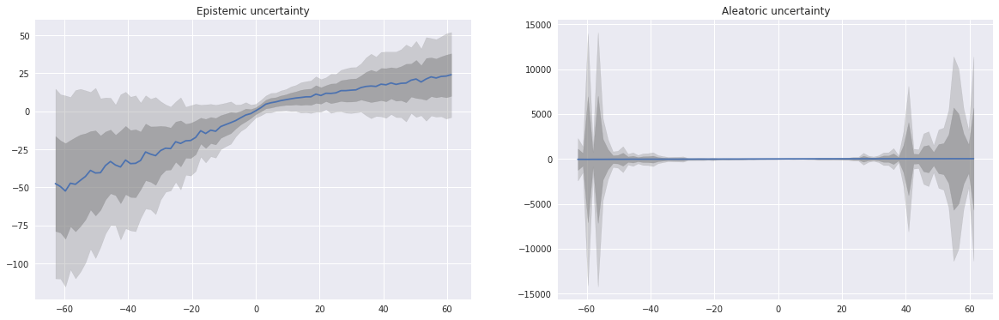

30000 th loss :tensor(328.0306)


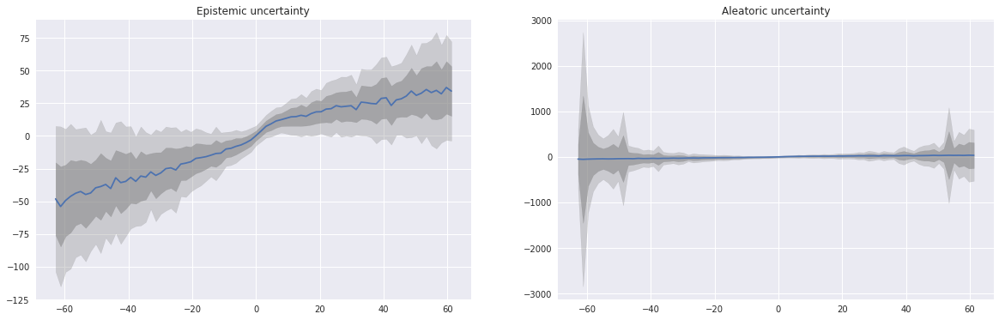

40000 th loss :tensor(195.5977)


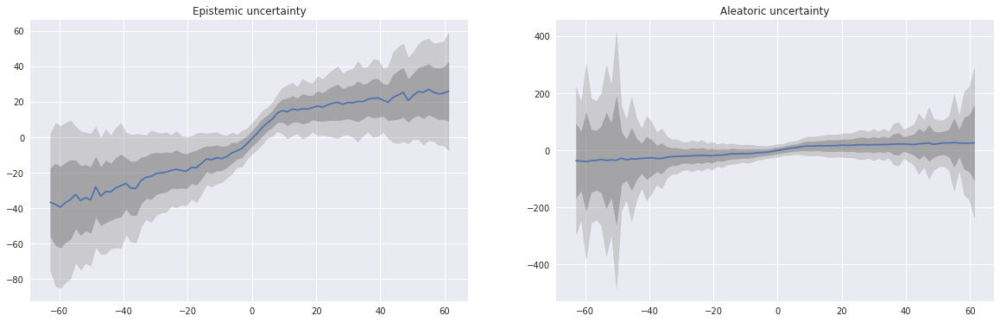

50000 th loss :tensor(96.6200)


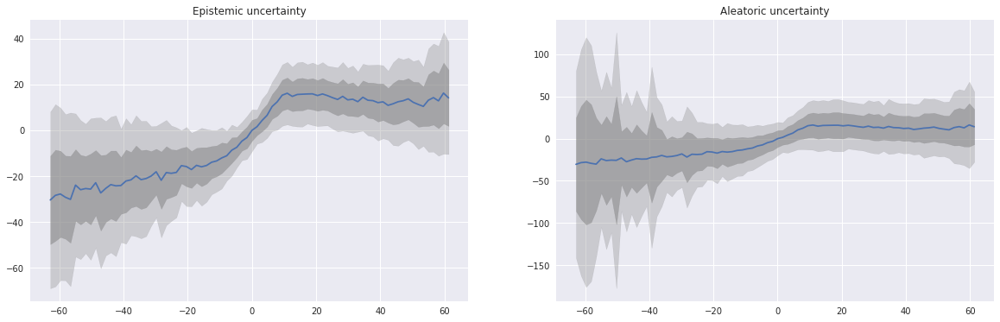

60000 th loss :tensor(131.5766)


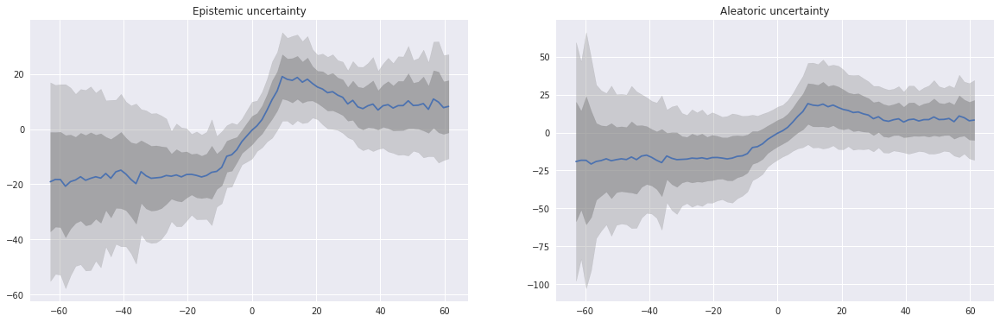

70000 th loss :tensor(153.9303)


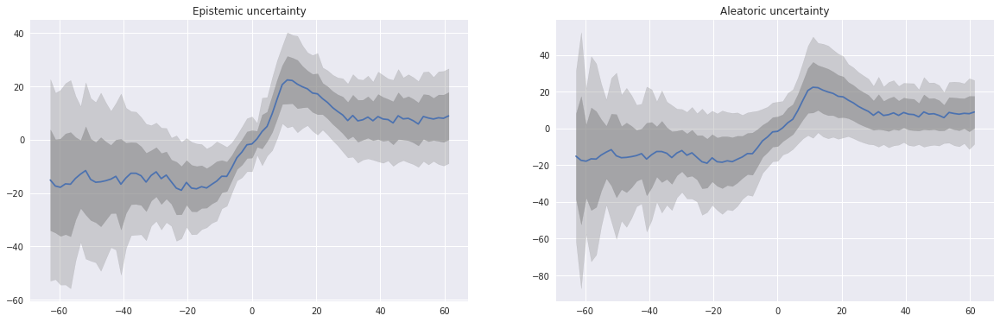

80000 th loss :tensor(89.1604)


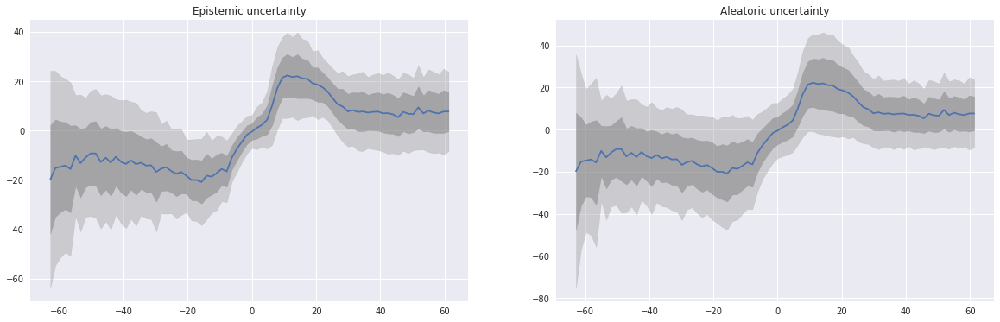

90000 th loss :tensor(133.6168)


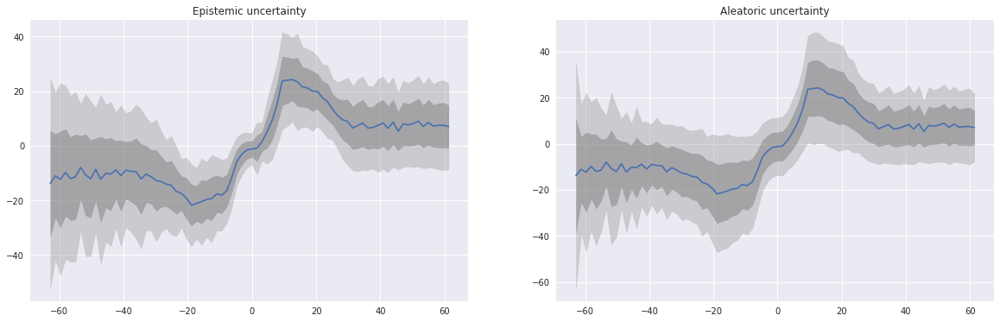

100000 th loss :tensor(89.2286)


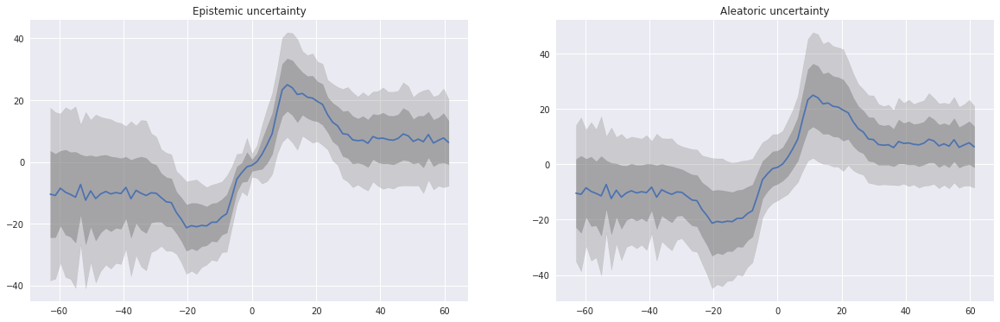

110000 th loss :tensor(48.7098)


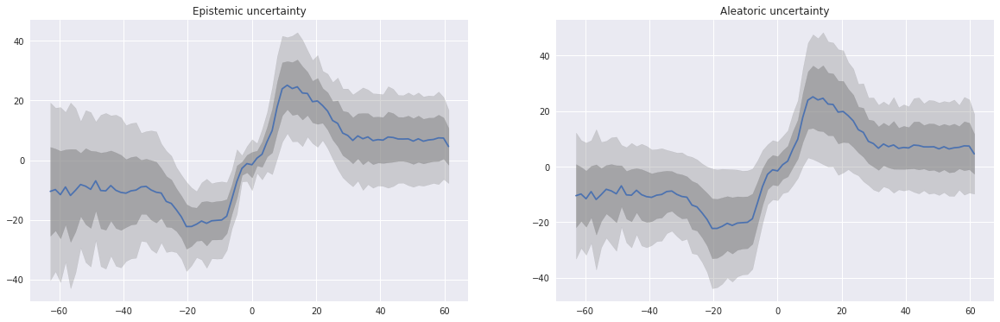

120000 th loss :tensor(89.7478)


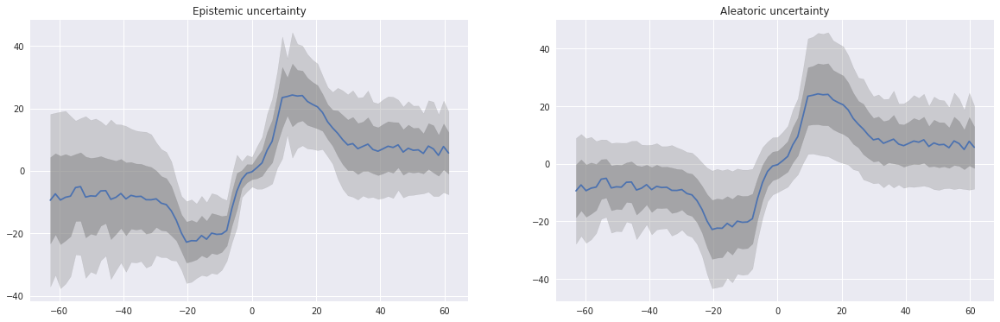

130000 th loss :tensor(78.2565)


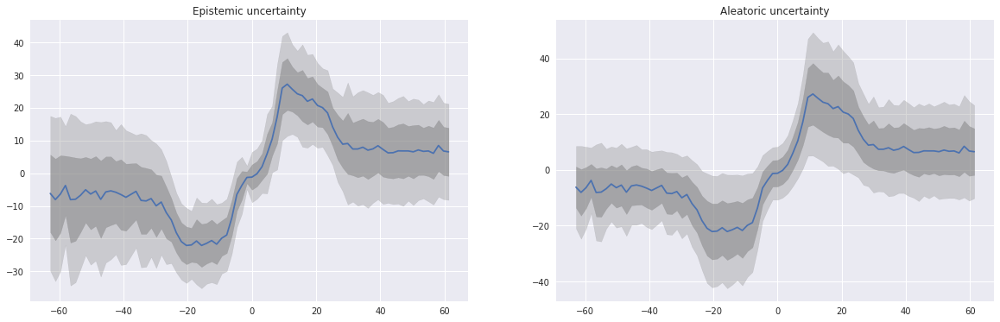

140000 th loss :tensor(57.2595)


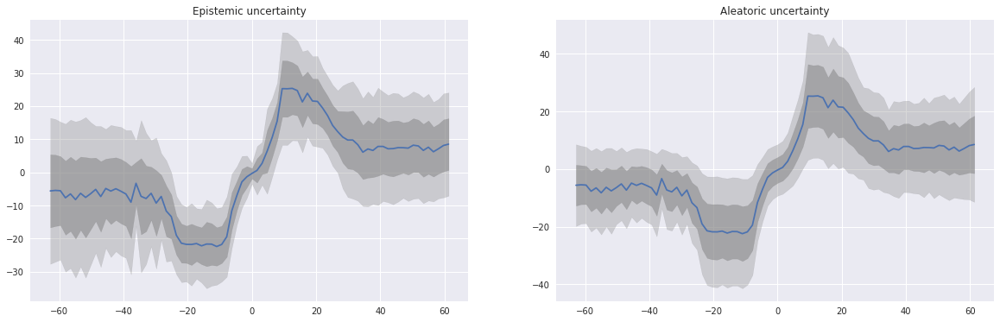

150000 th loss :tensor(33.5440)


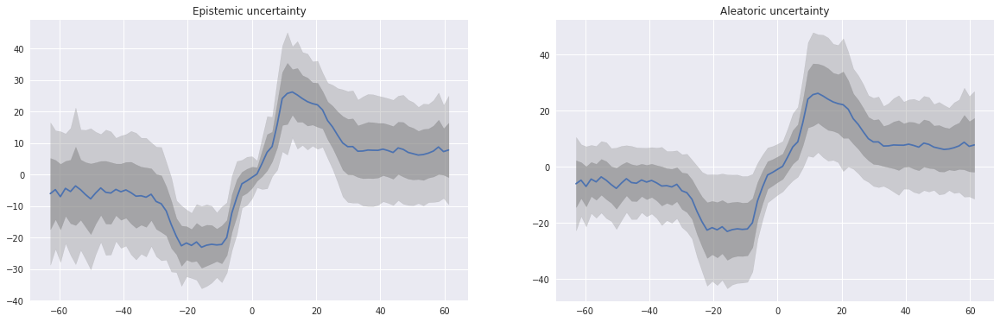

160000 th loss :tensor(65.5980)


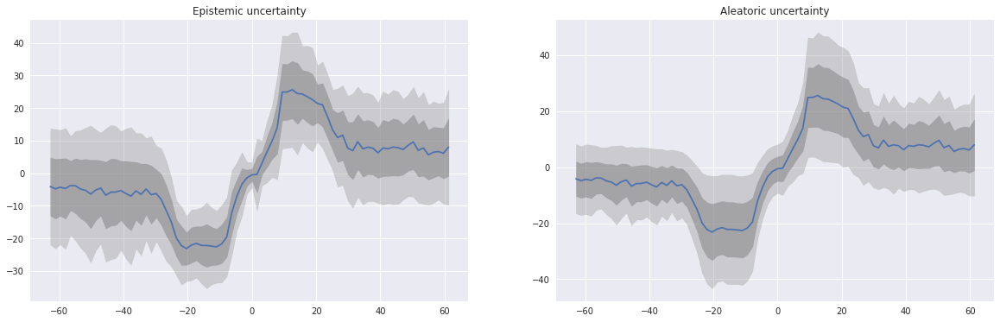

170000 th loss :tensor(38.9824)


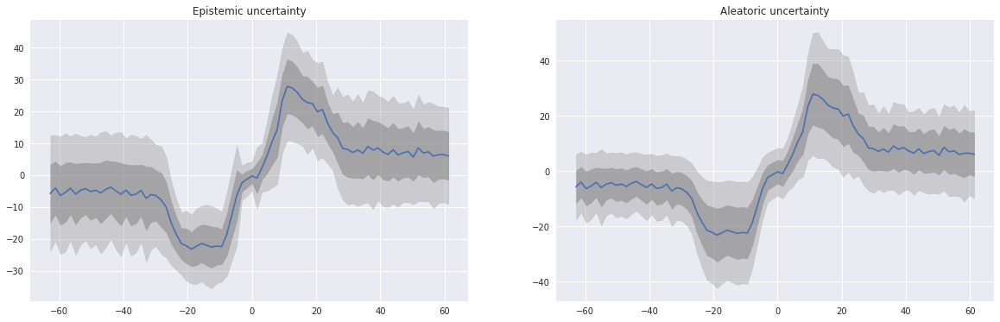

180000 th loss :tensor(124.8969)


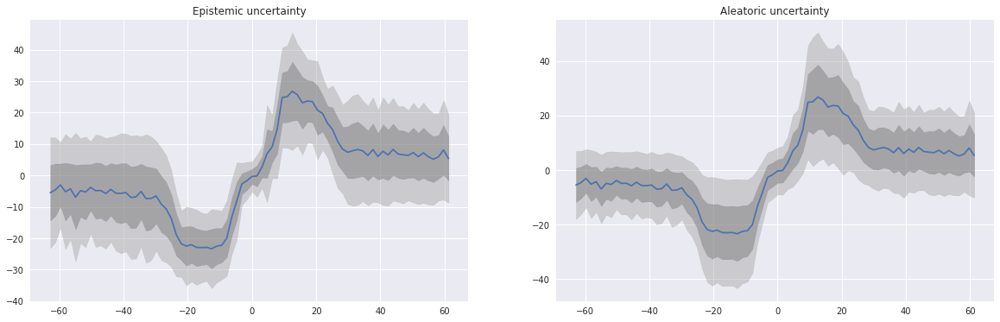

190000 th loss :tensor(54.3688)


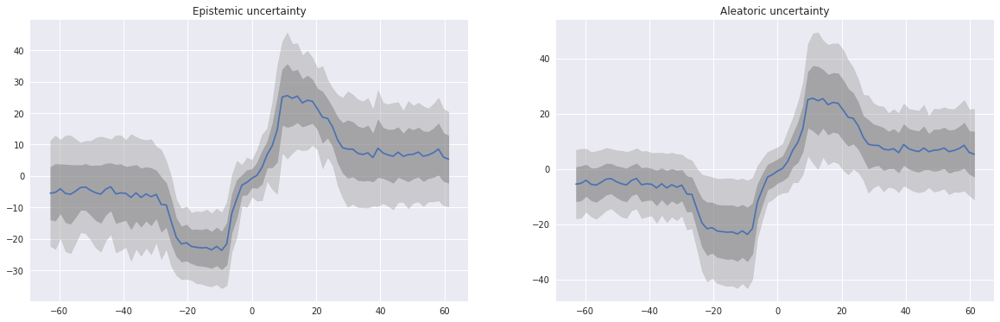

200000 th loss :tensor(48.6770)


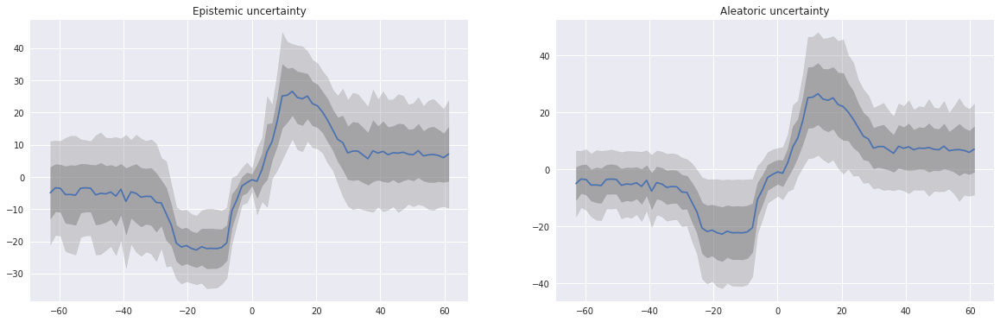

210000 th loss :tensor(55.0662)


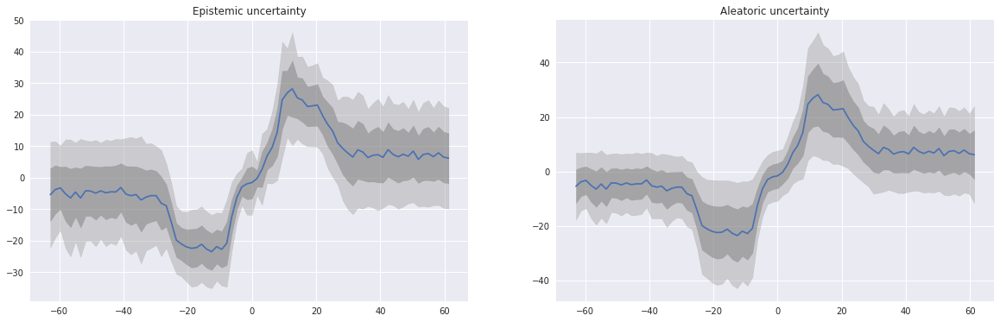

220000 th loss :tensor(31.8032)


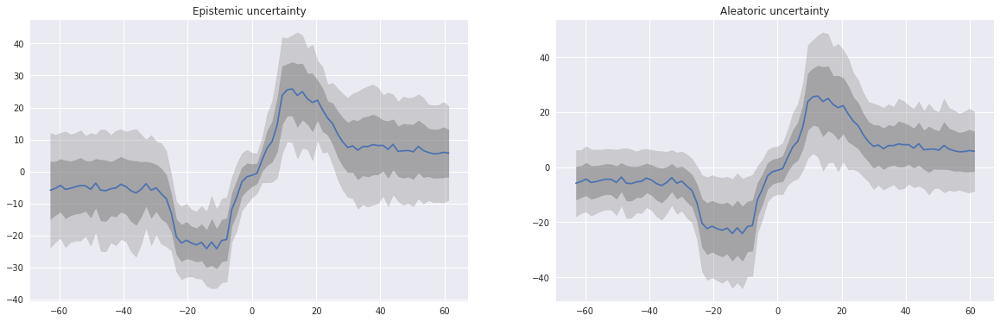

230000 th loss :tensor(57.0917)


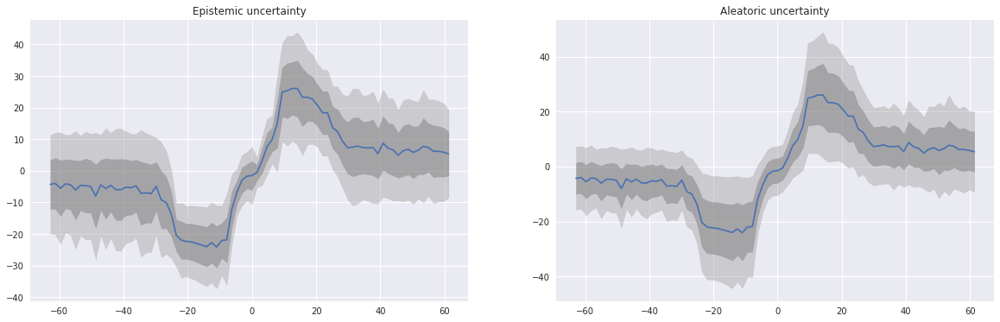

240000 th loss :tensor(110.0831)


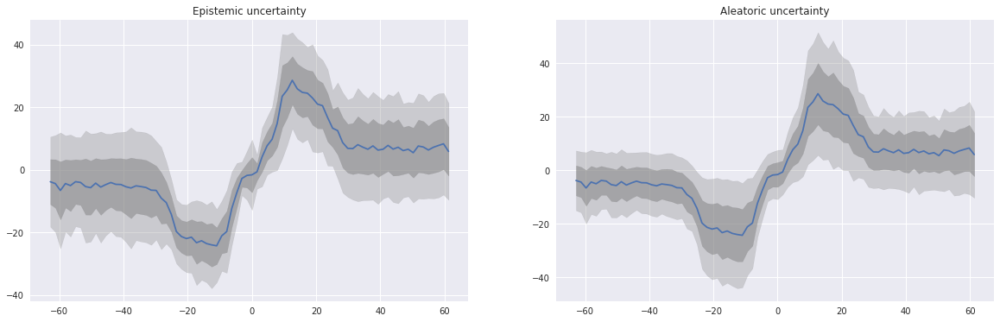

250000 th loss :tensor(100.0511)


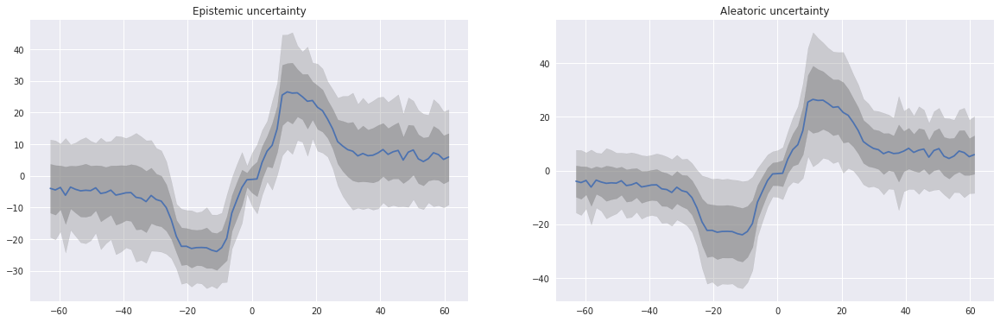

260000 th loss :tensor(71.3153)


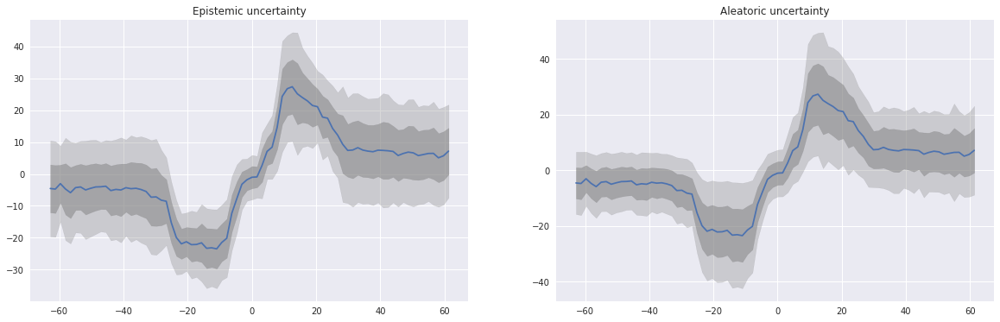

270000 th loss :tensor(53.2440)


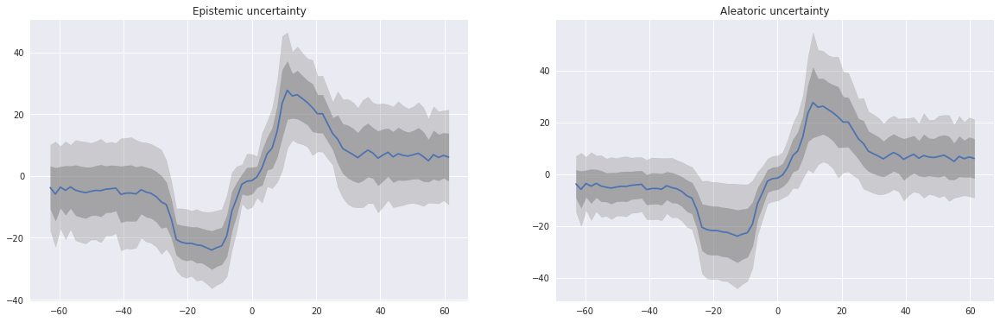

280000 th loss :tensor(72.0450)


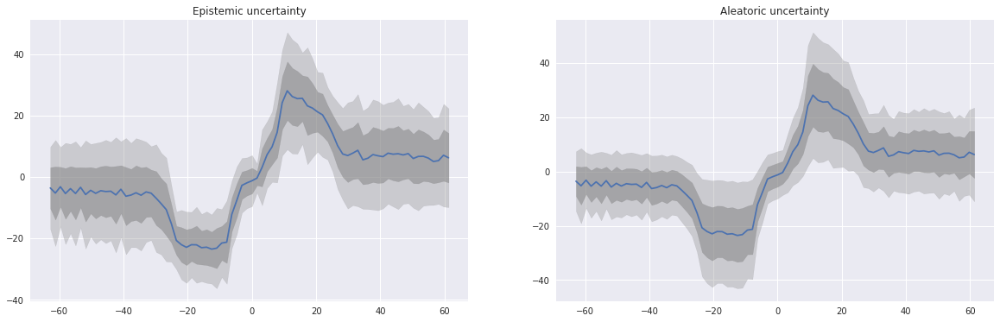

290000 th loss :tensor(17.8539)


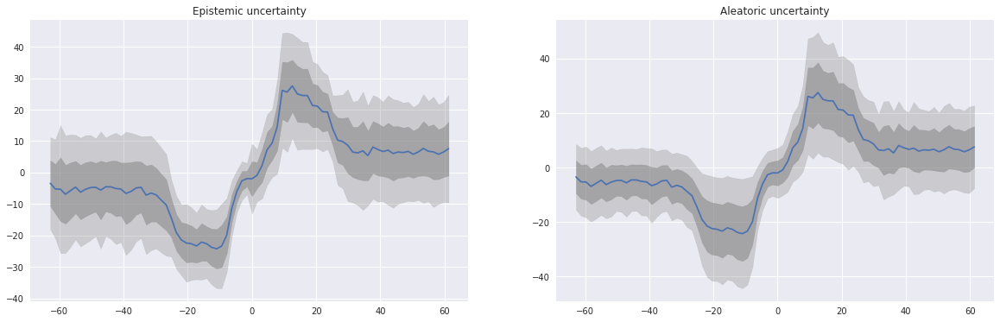

300000 th loss :tensor(27.0108)


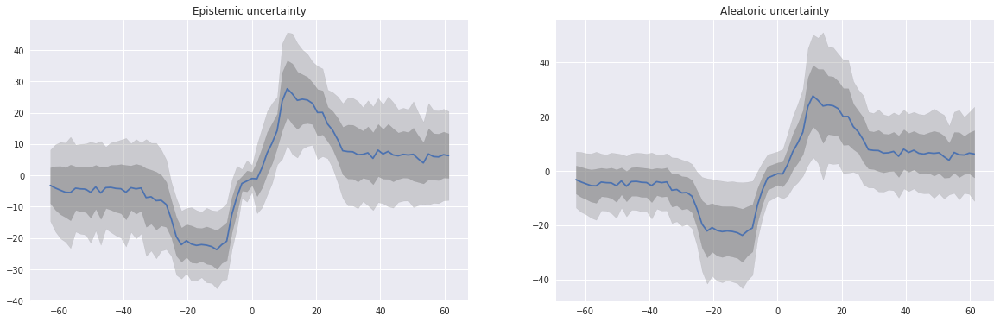

310000 th loss :tensor(43.4929)


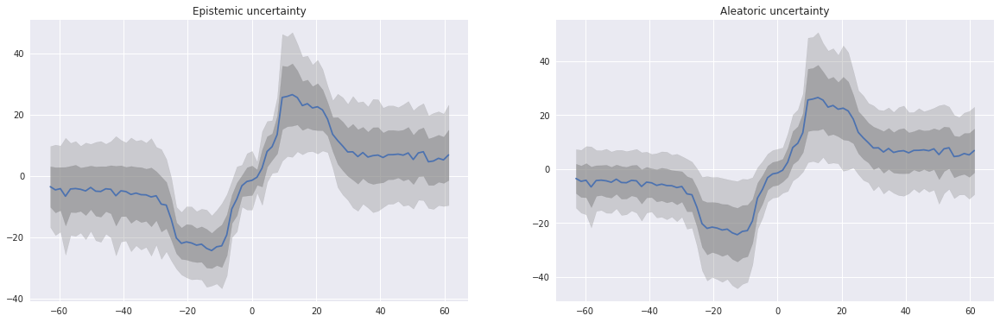

320000 th loss :tensor(83.1501)


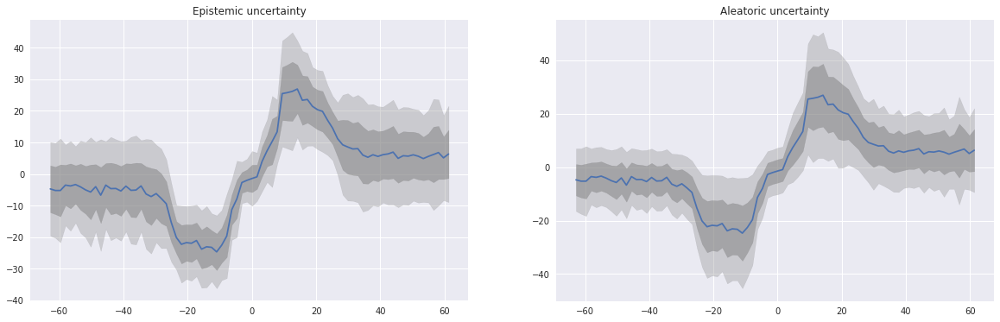

330000 th loss :tensor(68.8382)


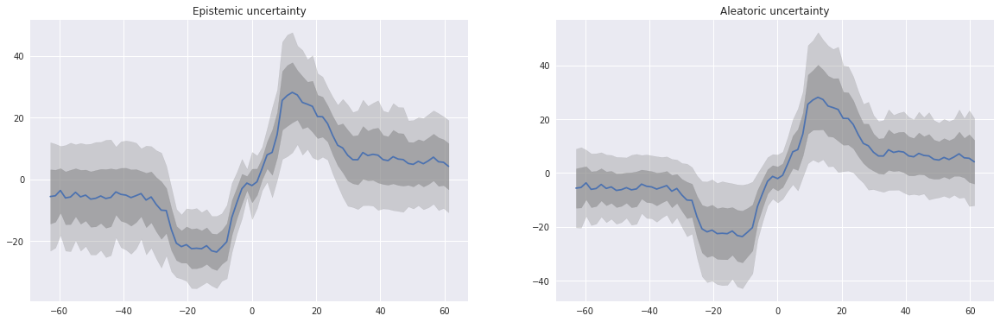

340000 th loss :tensor(29.7107)


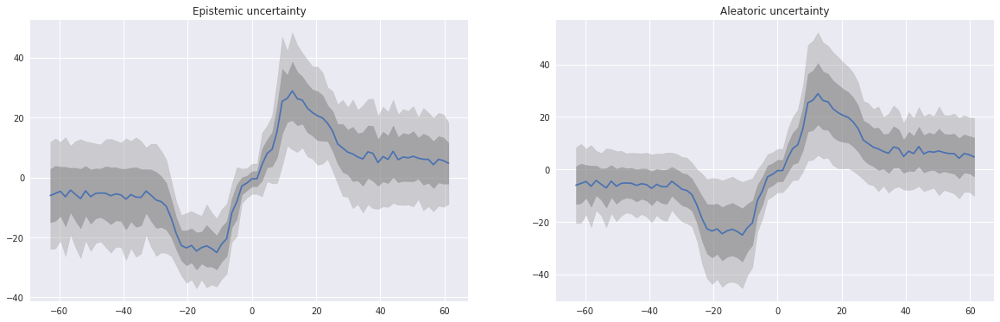

350000 th loss :tensor(94.0244)


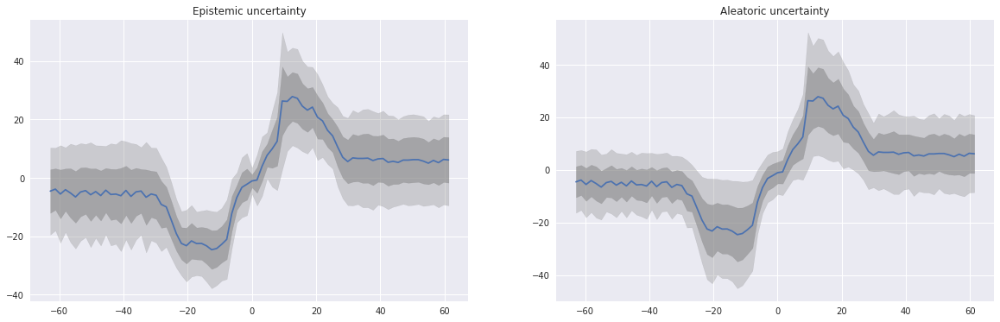

360000 th loss :tensor(52.4128)


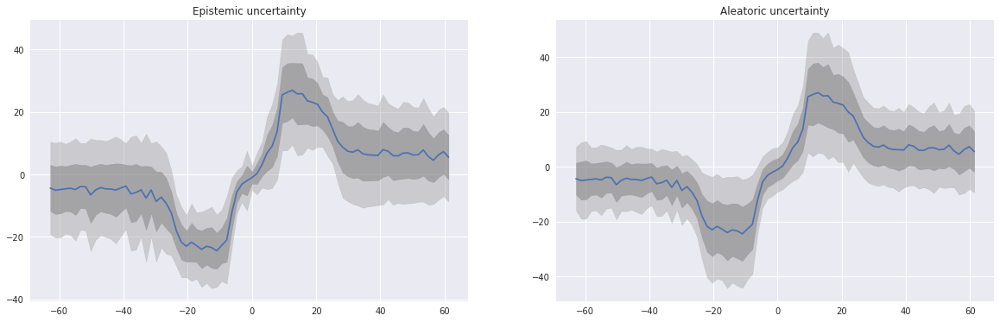

370000 th loss :tensor(67.4381)


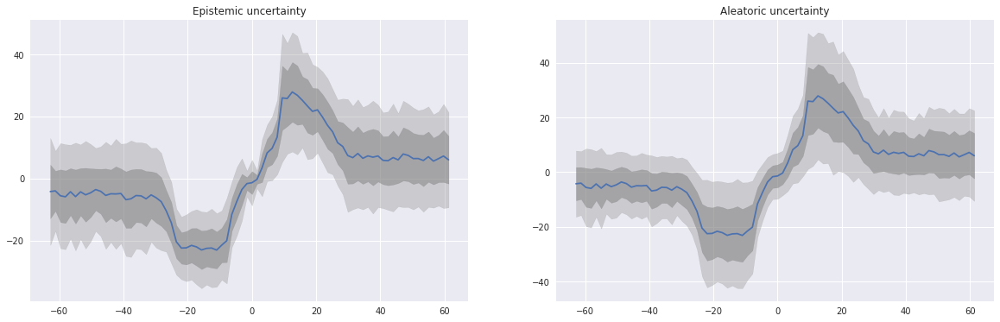

380000 th loss :tensor(116.0296)


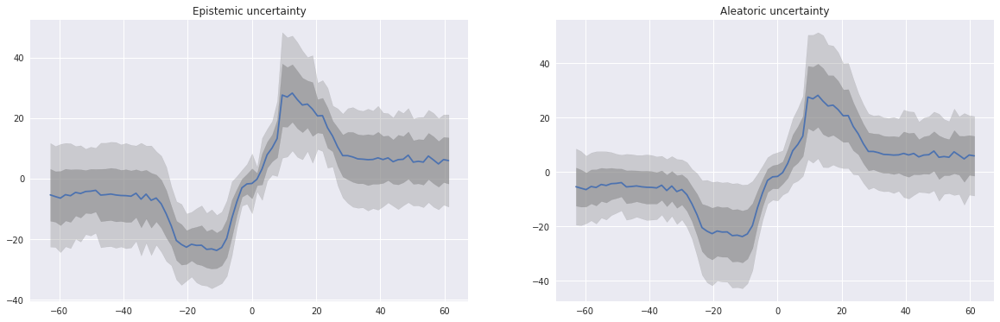

390000 th loss :tensor(75.2077)


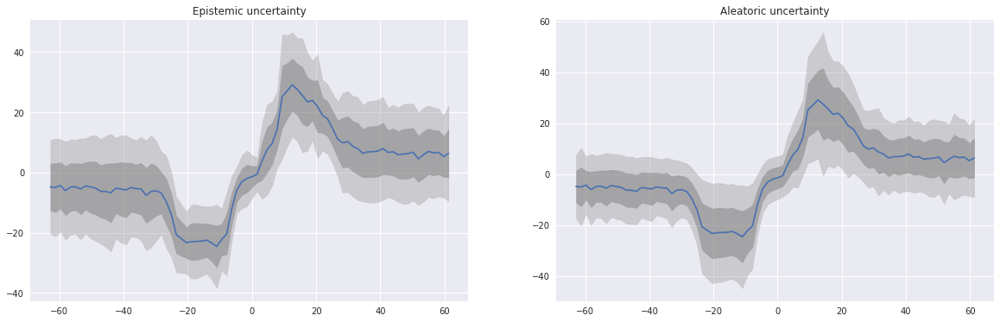

400000 th loss :tensor(36.4037)


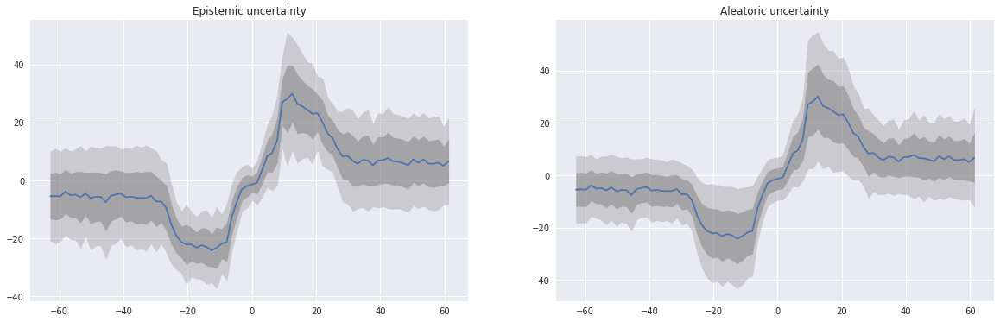

410000 th loss :tensor(89.0553)


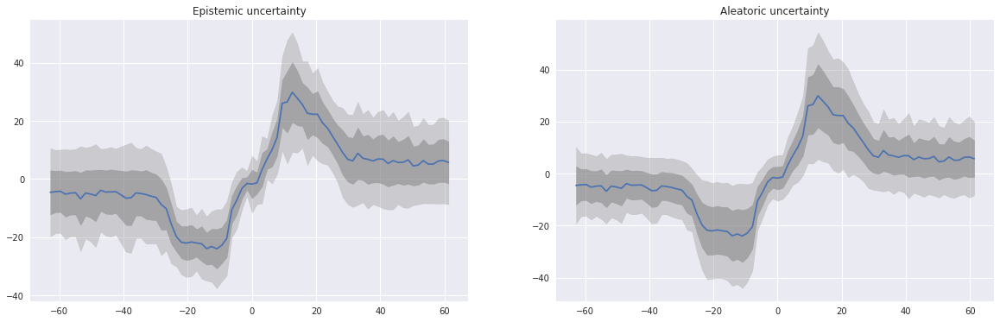

420000 th loss :tensor(71.9384)


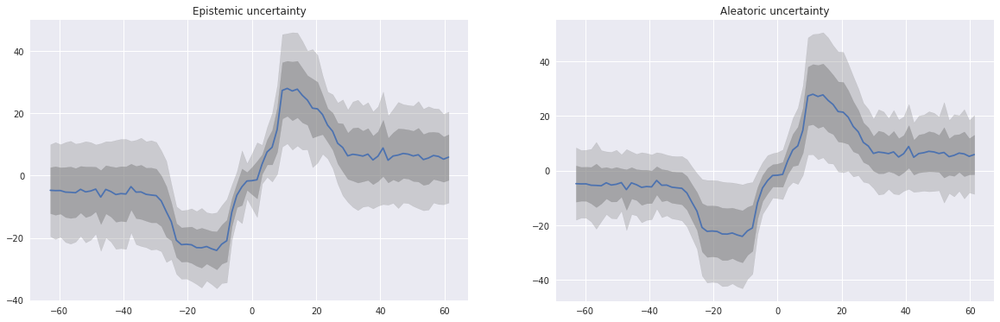

430000 th loss :tensor(78.6377)


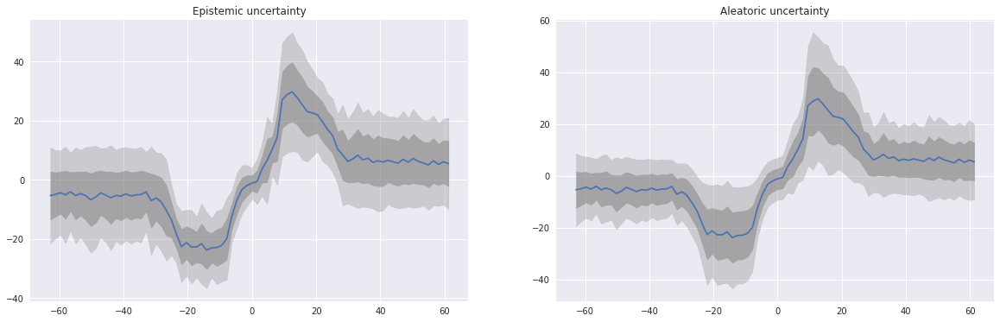

440000 th loss :tensor(78.8445)


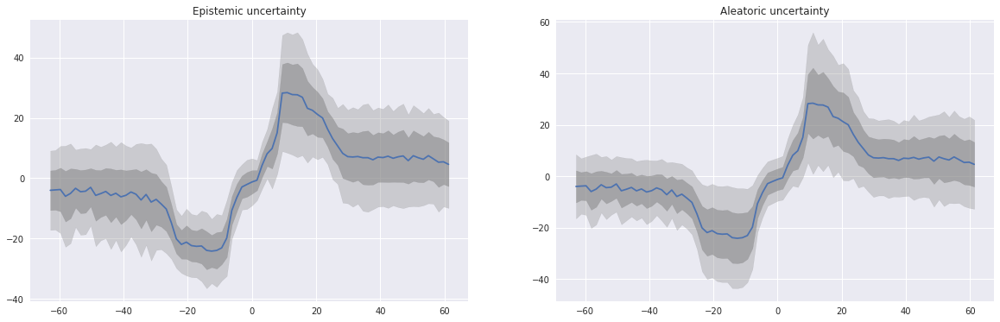

450000 th loss :tensor(54.5495)


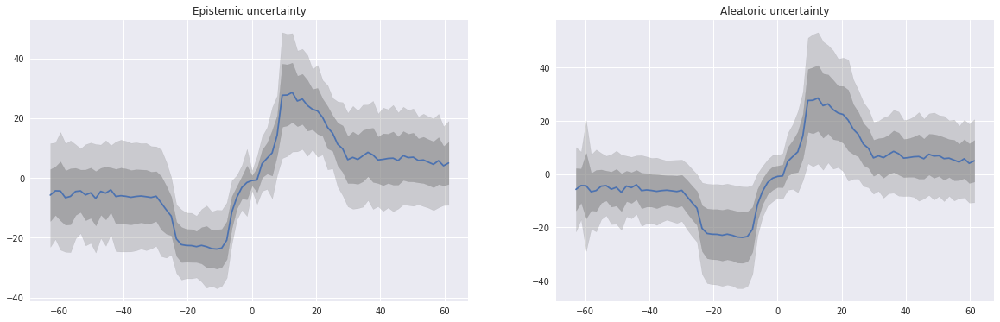

460000 th loss :tensor(56.1825)


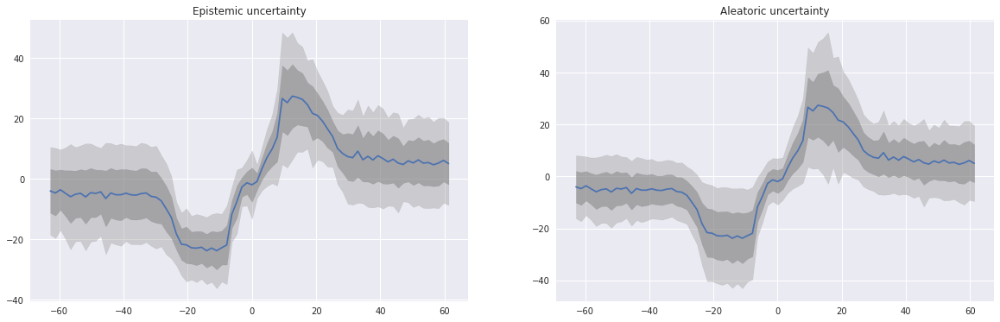

470000 th loss :tensor(55.8819)


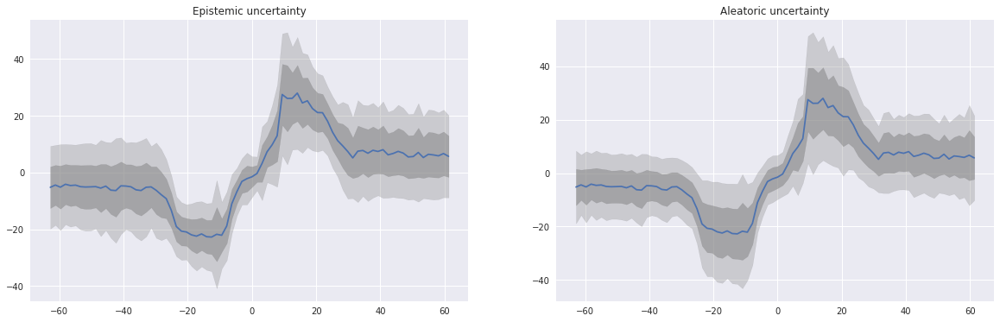

480000 th loss :tensor(8.1381)


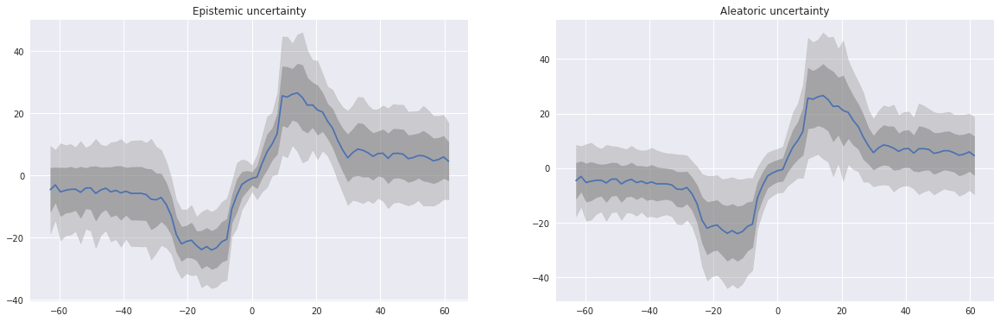

490000 th loss :tensor(53.4844)


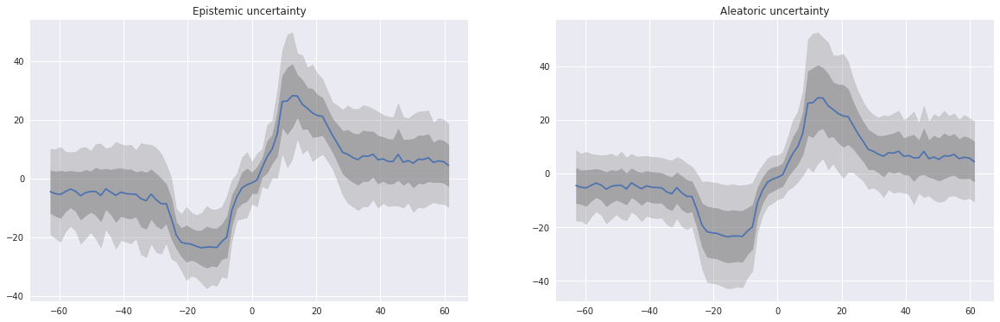

500000 th loss :tensor(116.3208)


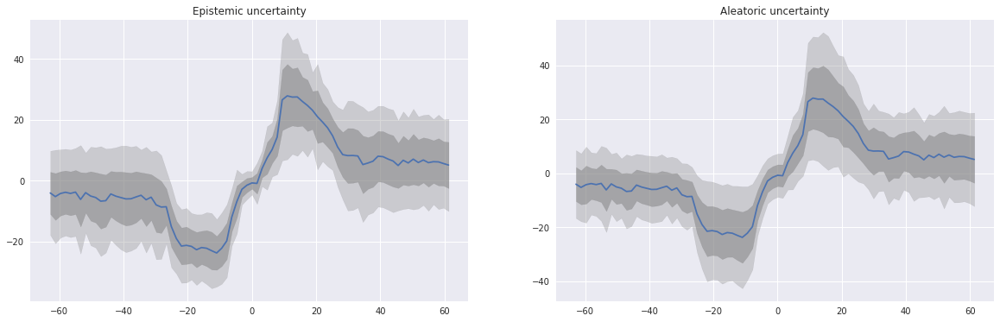

510000 th loss :tensor(75.1408)


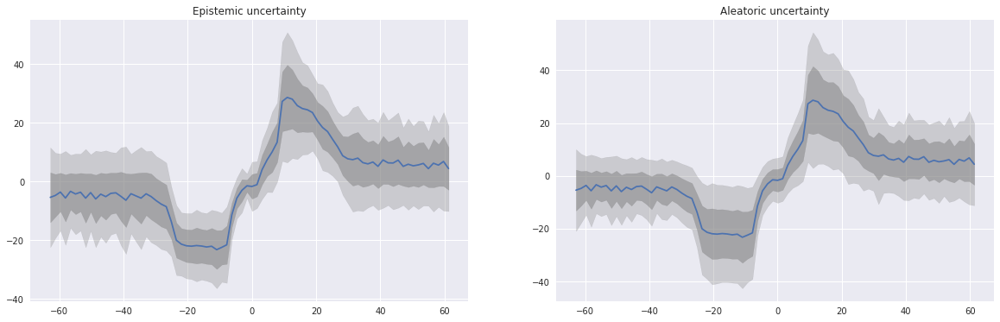

520000 th loss :tensor(34.8746)


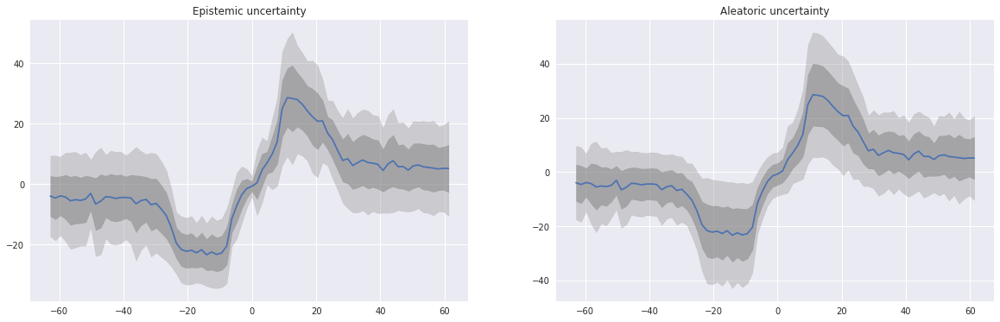

530000 th loss :tensor(118.0066)


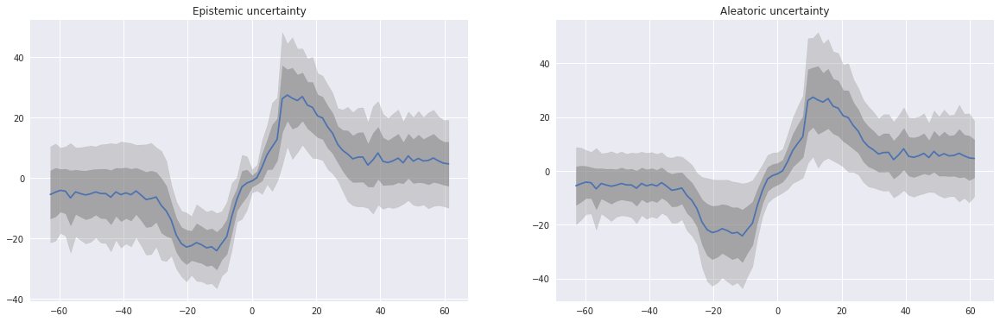

540000 th loss :tensor(93.4893)


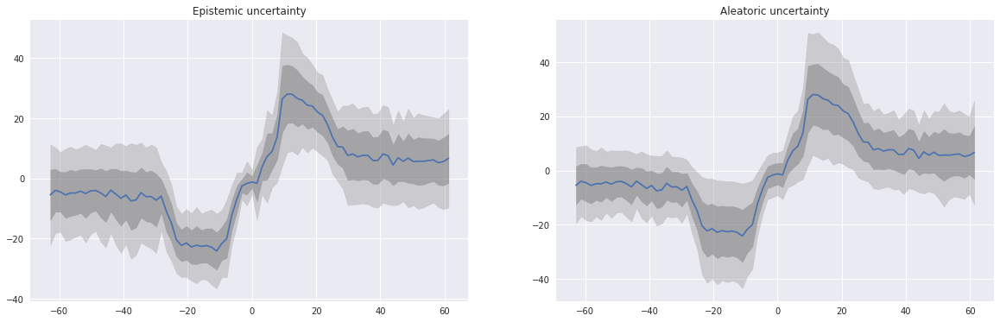

550000 th loss :tensor(34.1959)


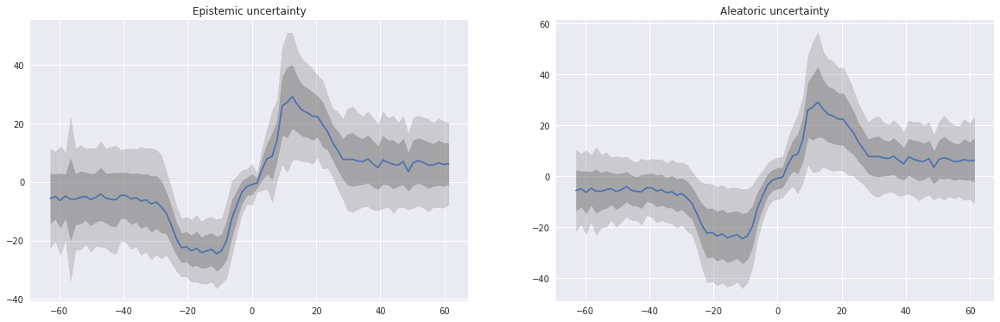

560000 th loss :tensor(46.2444)


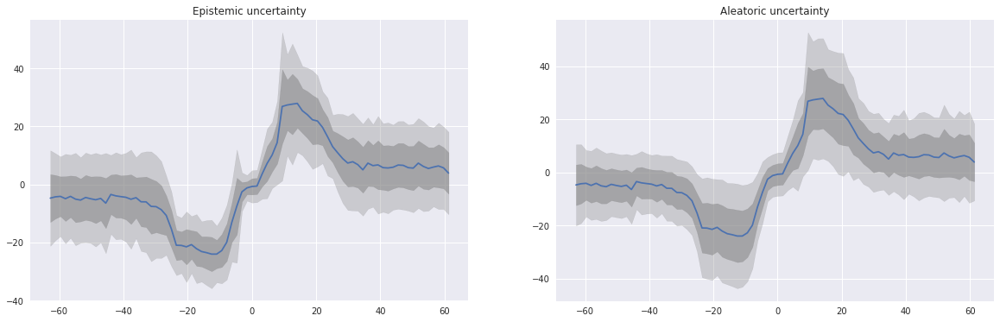

570000 th loss :tensor(74.8809)


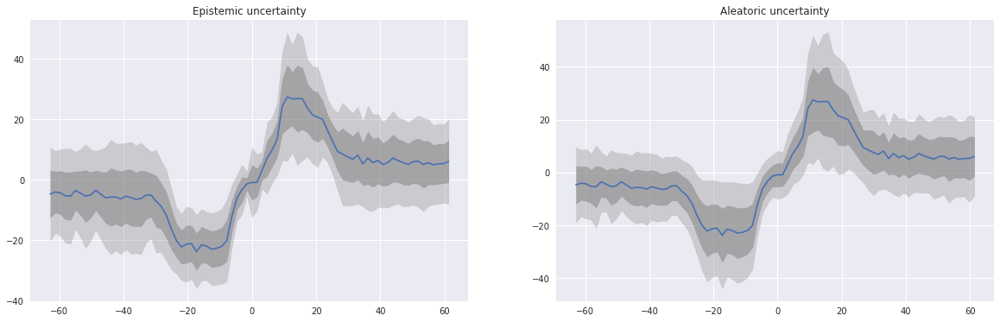

580000 th loss :tensor(103.3516)


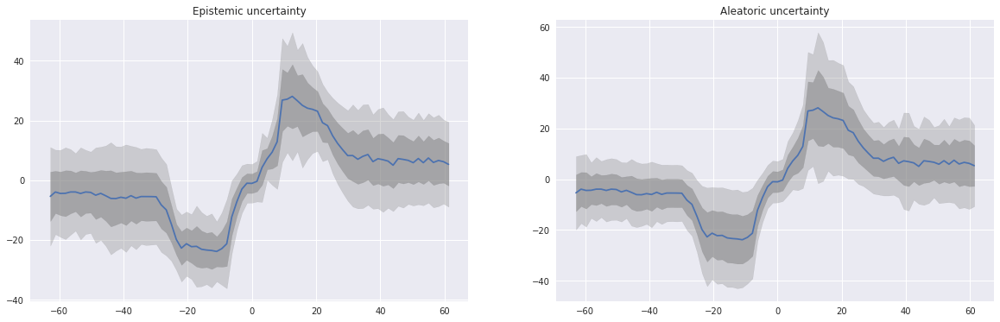

590000 th loss :tensor(82.0910)


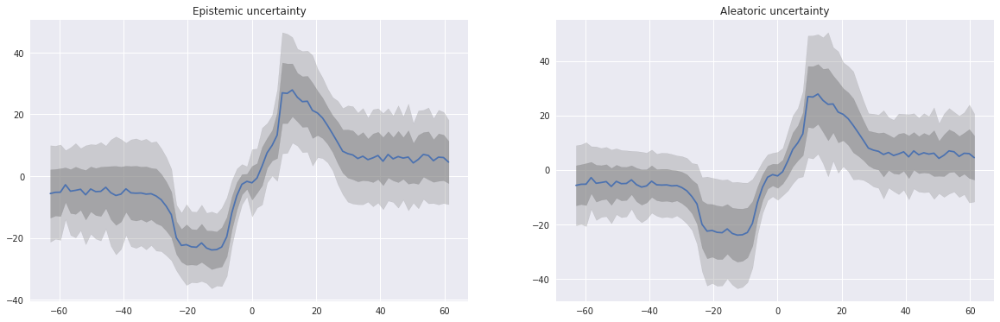

600000 th loss :tensor(80.3703)


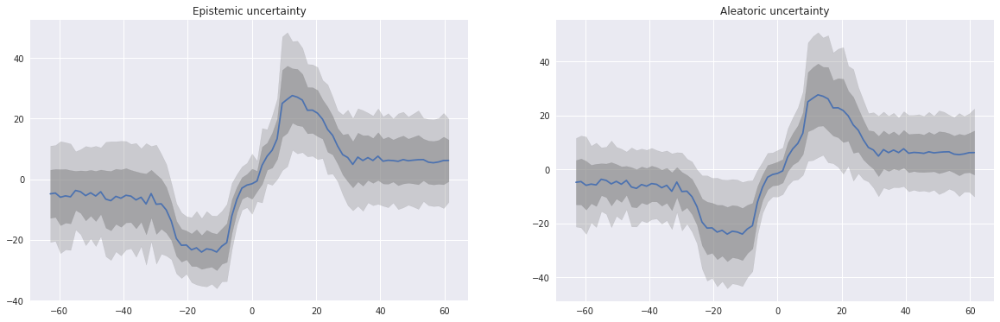

610000 th loss :tensor(25.0702)


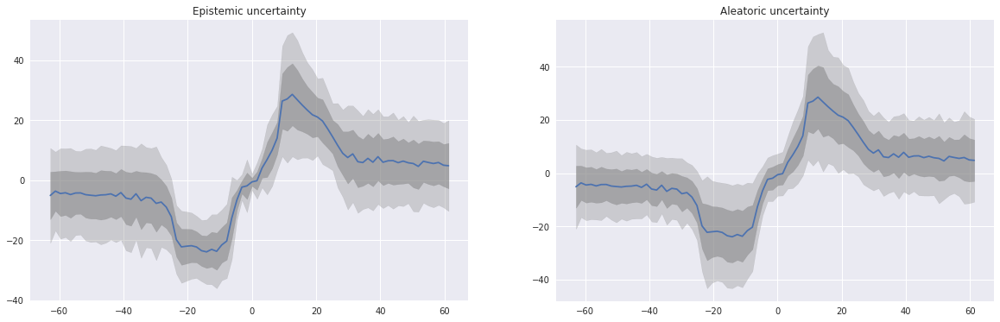

620000 th loss :tensor(54.7663)


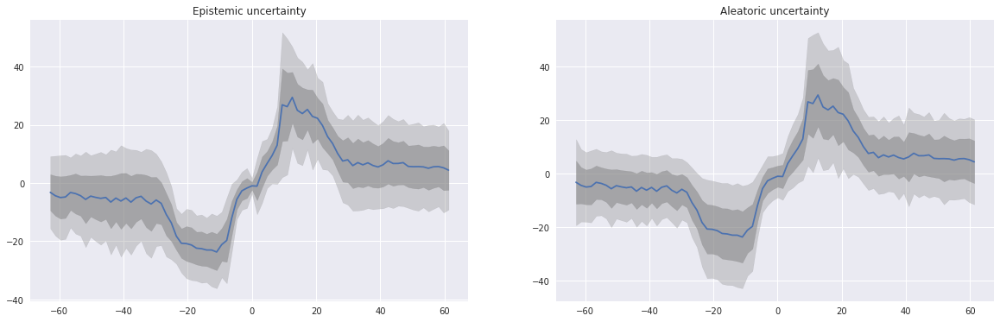

630000 th loss :tensor(55.0533)


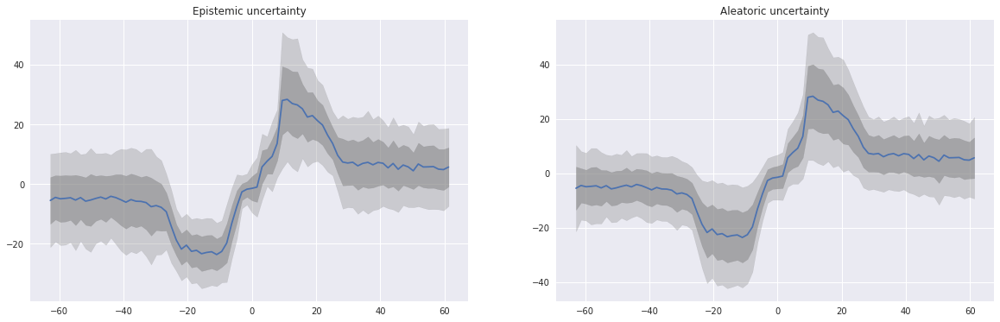

640000 th loss :tensor(68.6335)


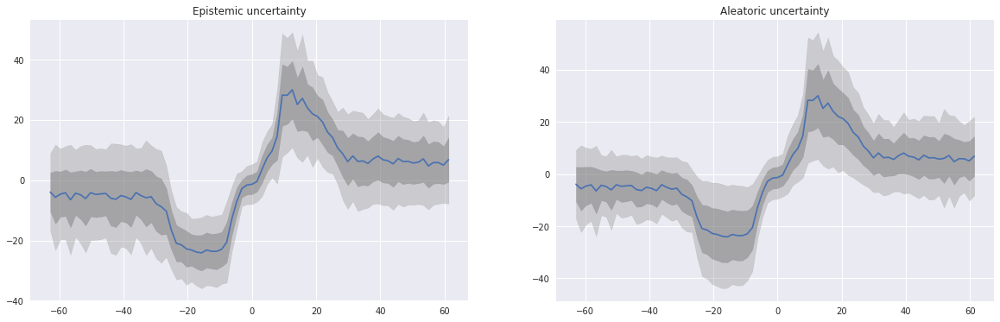

650000 th loss :tensor(73.9999)


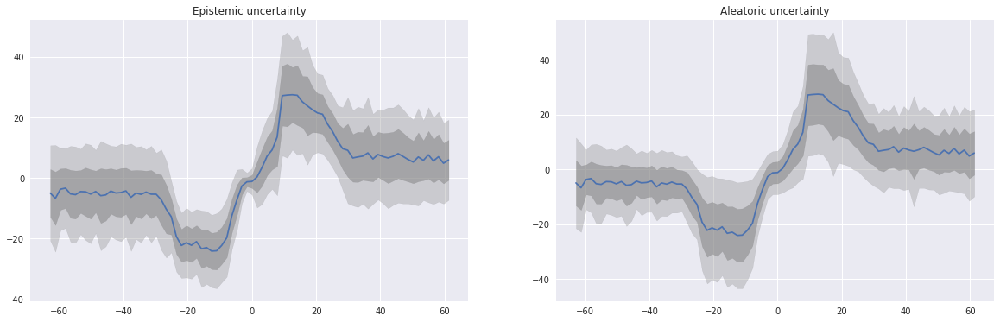

660000 th loss :tensor(22.7055)


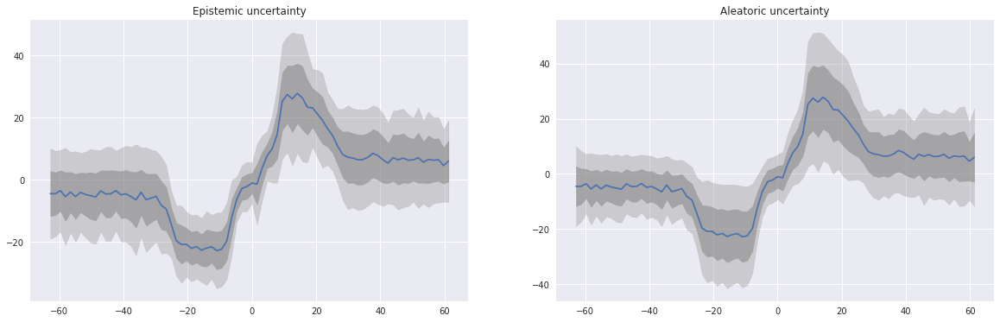

670000 th loss :tensor(47.9562)


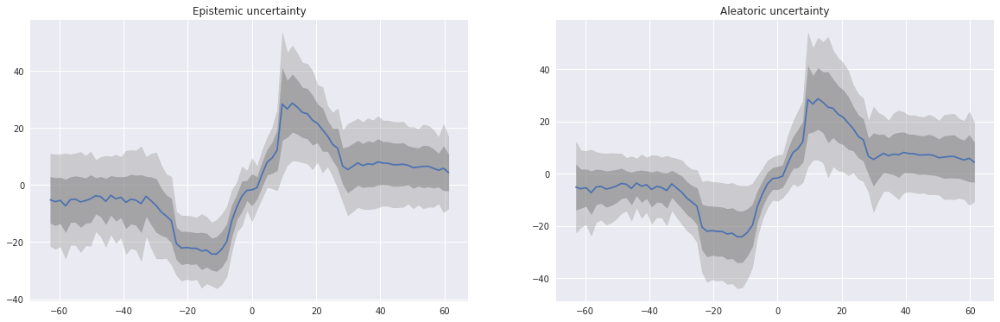

680000 th loss :tensor(23.2451)


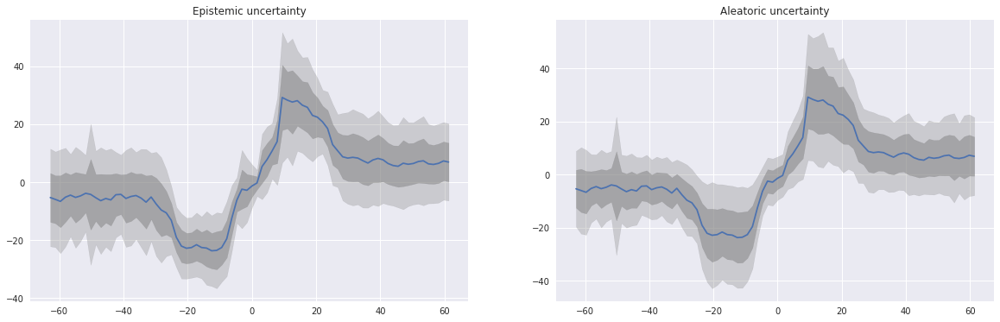

690000 th loss :tensor(56.9502)


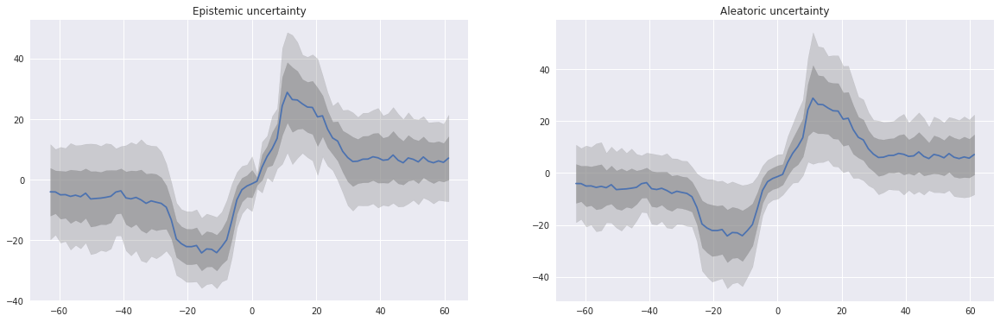

700000 th loss :tensor(31.3162)


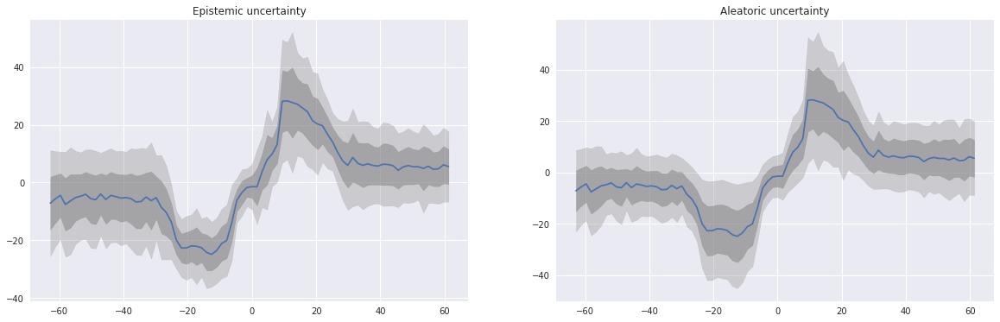

710000 th loss :tensor(60.1054)


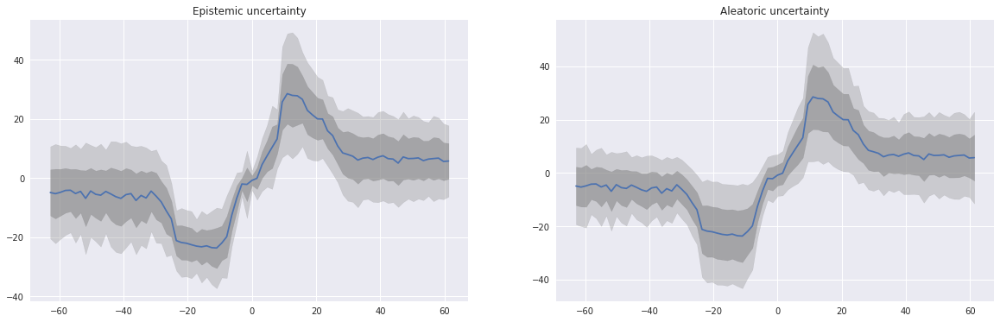

720000 th loss :tensor(69.8304)


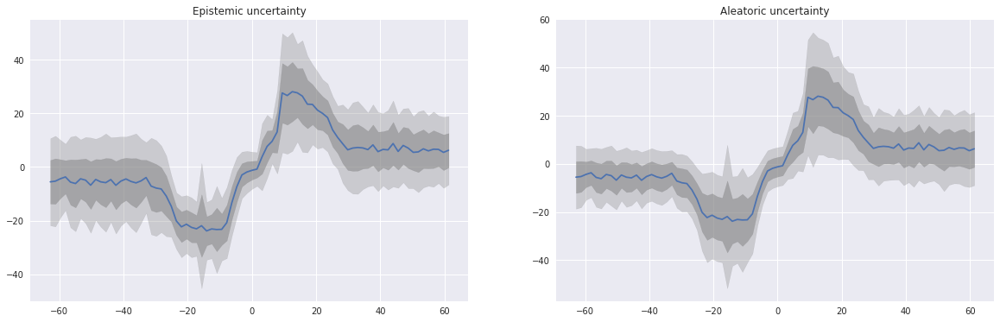

730000 th loss :tensor(24.2051)


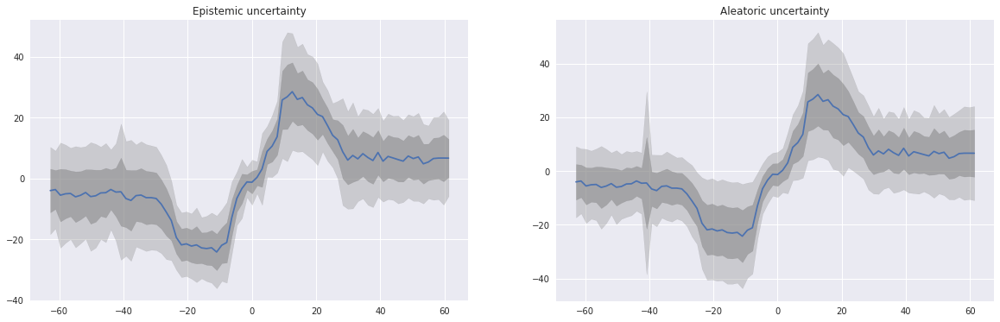

740000 th loss :tensor(64.0862)


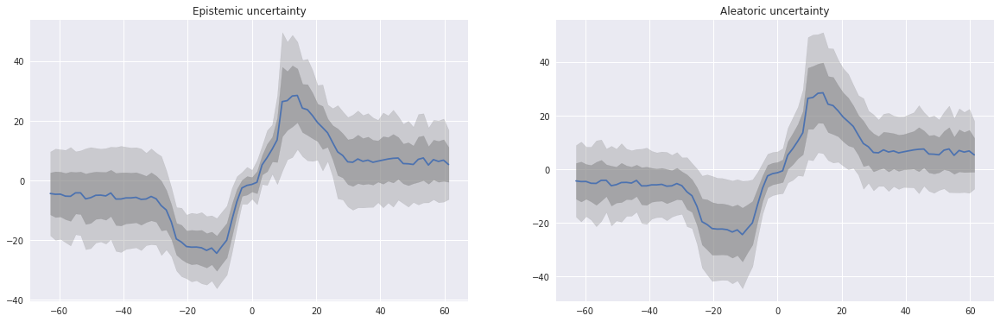

750000 th loss :tensor(15.6877)


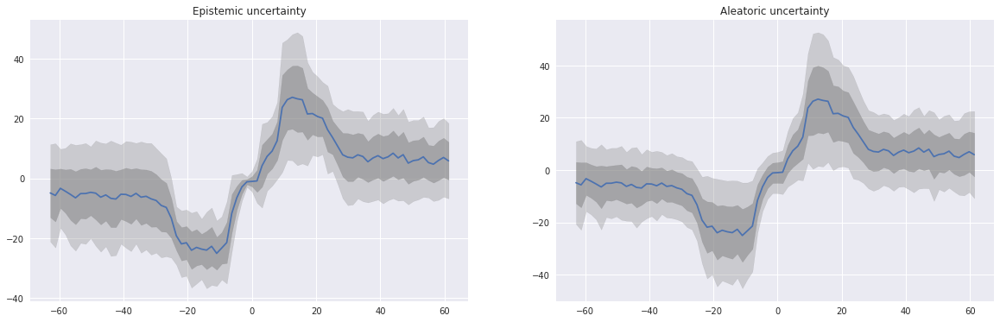

760000 th loss :tensor(90.6367)


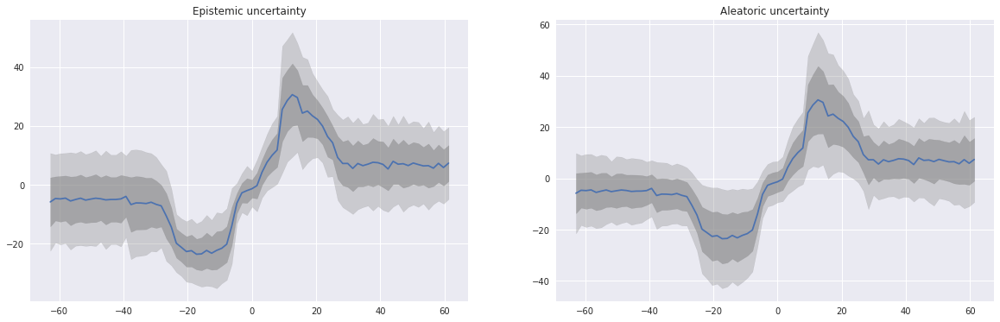

770000 th loss :tensor(50.6657)


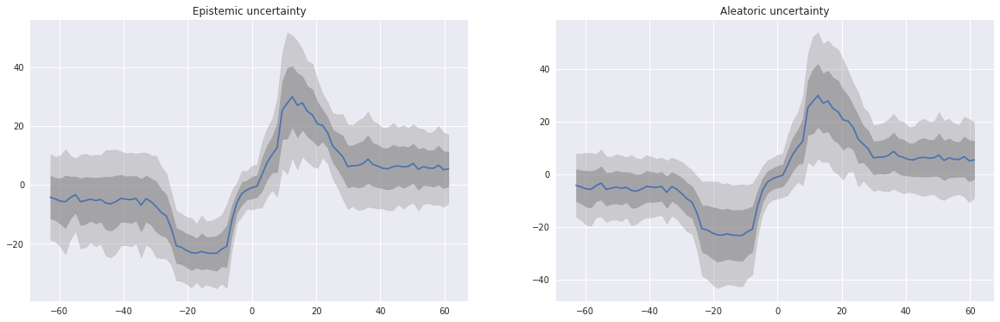

780000 th loss :tensor(83.3270)


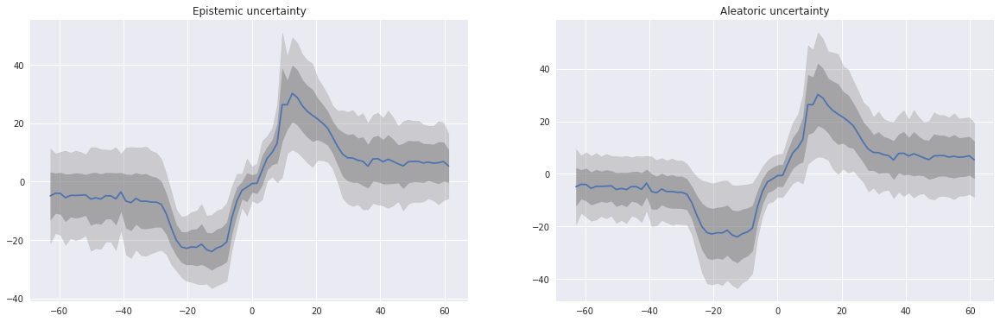

790000 th loss :tensor(94.8469)


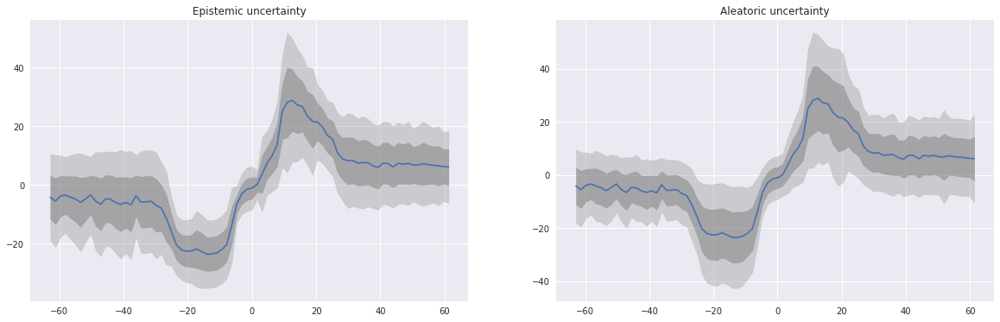

800000 th loss :tensor(100.2306)


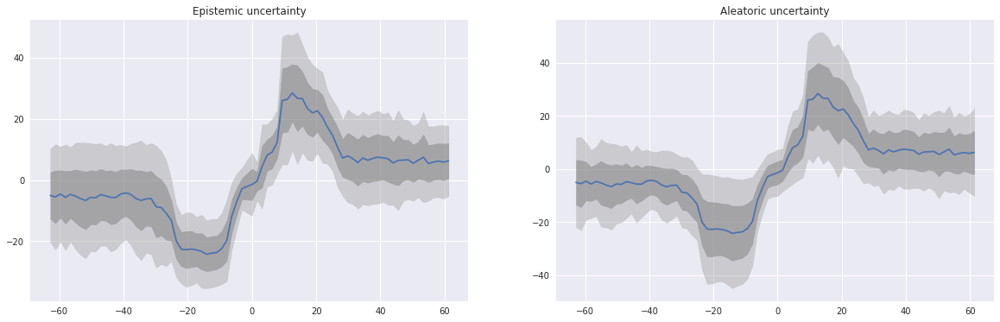

810000 th loss :tensor(55.8805)


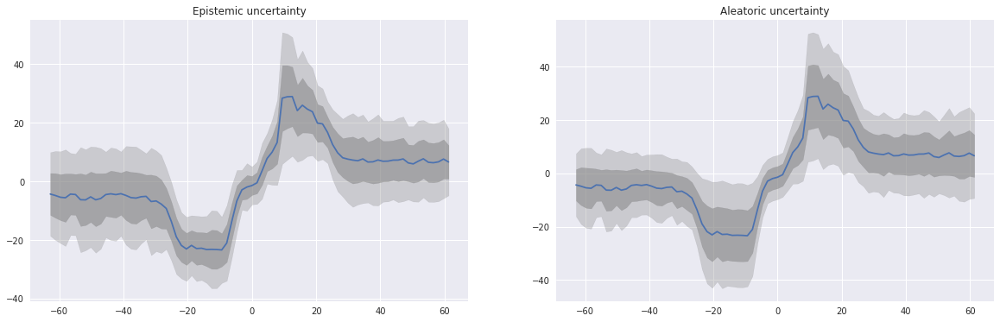

820000 th loss :tensor(40.6735)


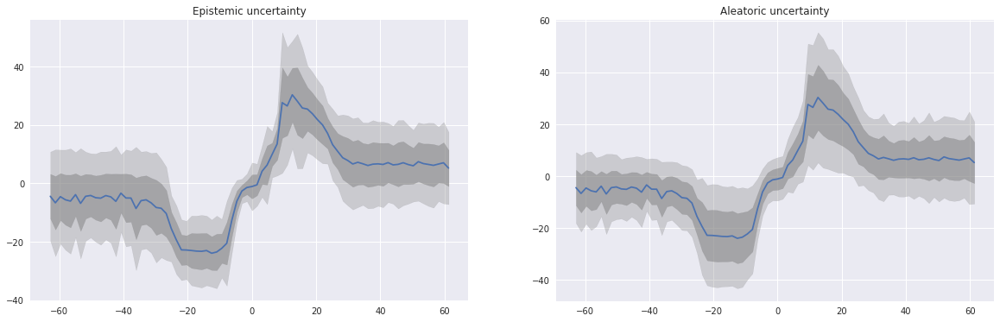

830000 th loss :tensor(106.5498)


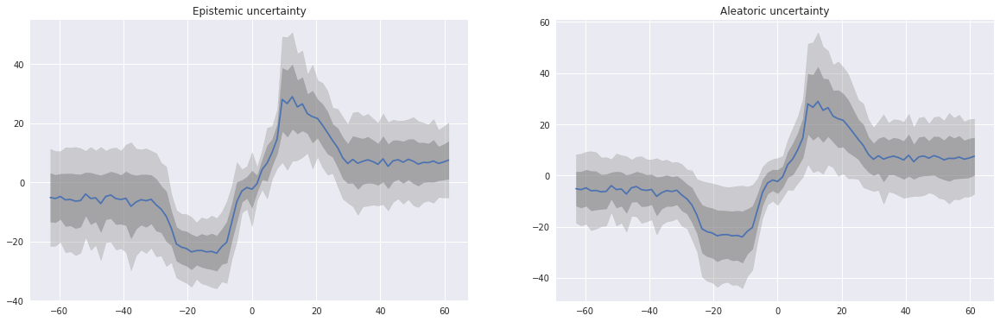

840000 th loss :tensor(43.9106)


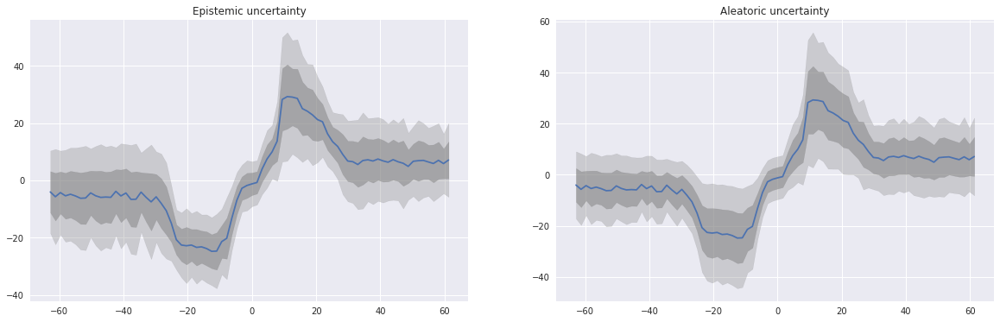

850000 th loss :tensor(48.4497)


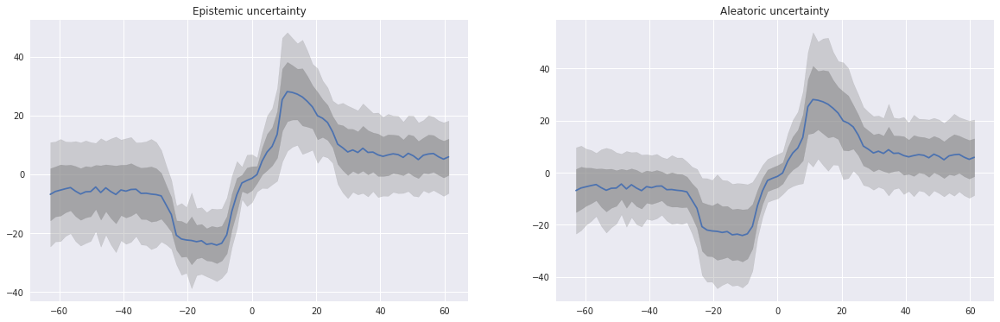

860000 th loss :tensor(83.1739)


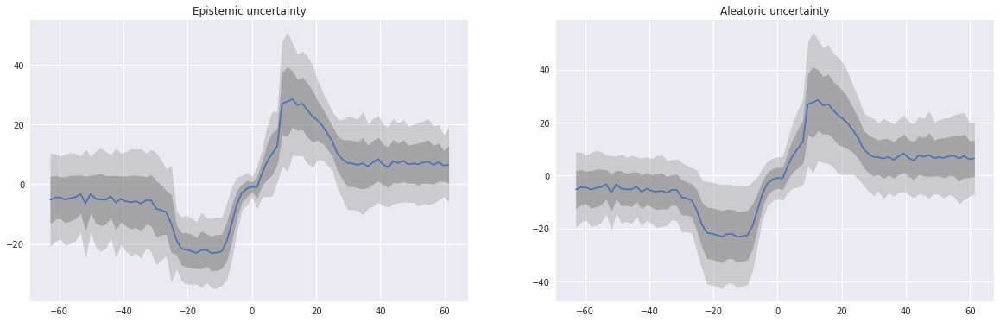

870000 th loss :tensor(80.4910)


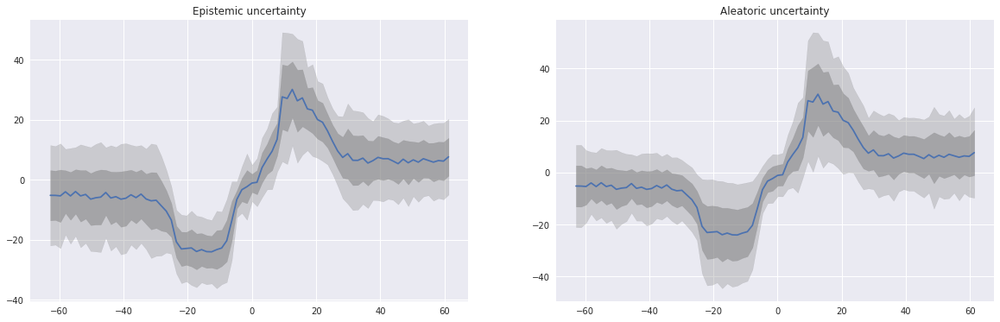

880000 th loss :tensor(36.6066)


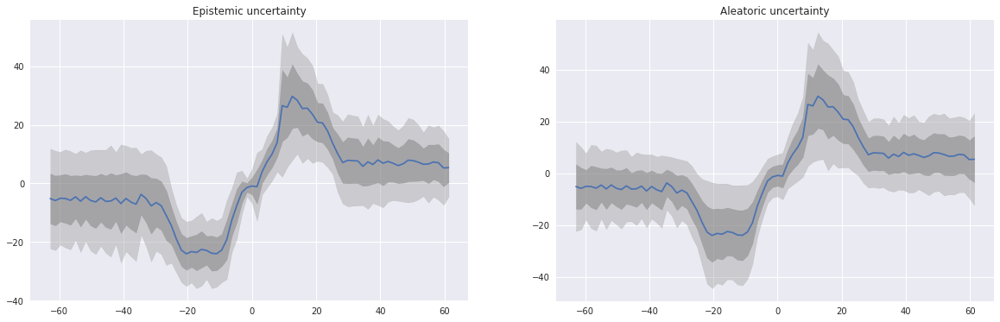

890000 th loss :tensor(75.5726)


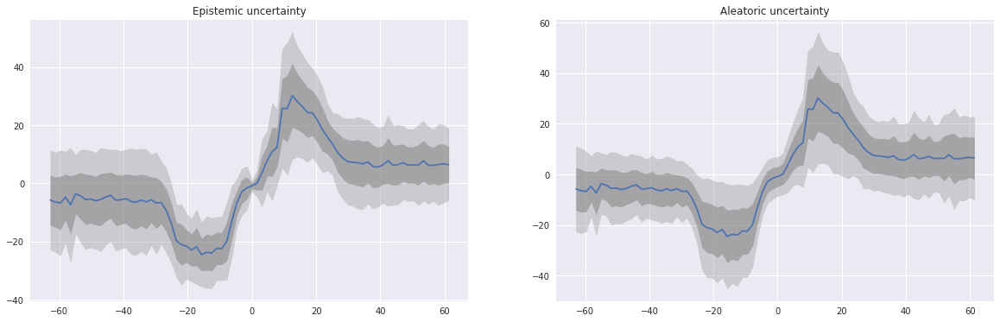

900000 th loss :tensor(49.7545)


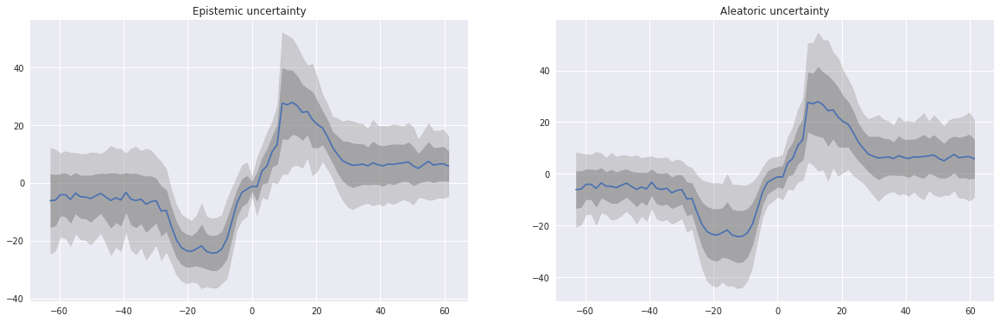

910000 th loss :tensor(24.1708)


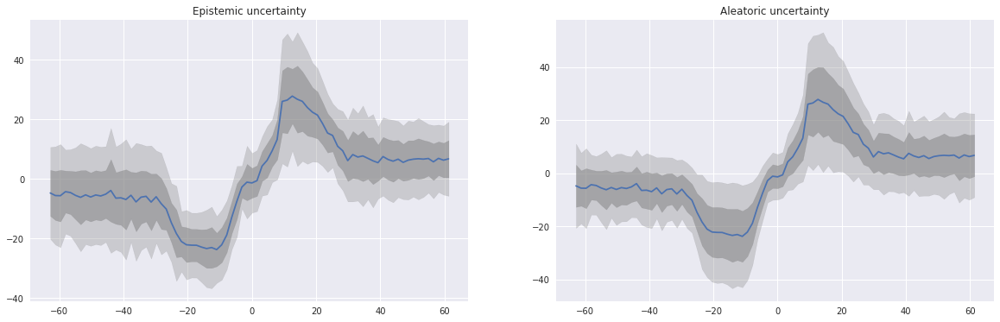

920000 th loss :tensor(110.5886)


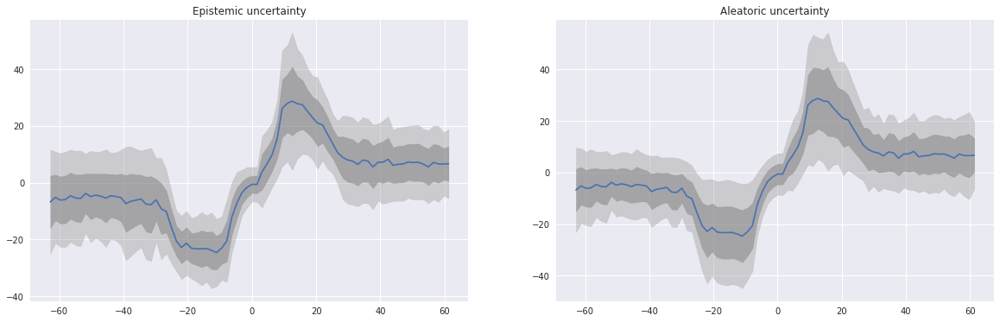

930000 th loss :tensor(40.0826)


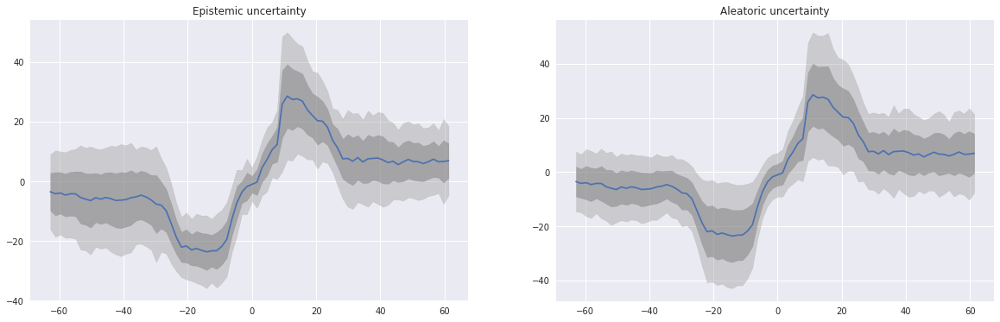

940000 th loss :tensor(40.0210)


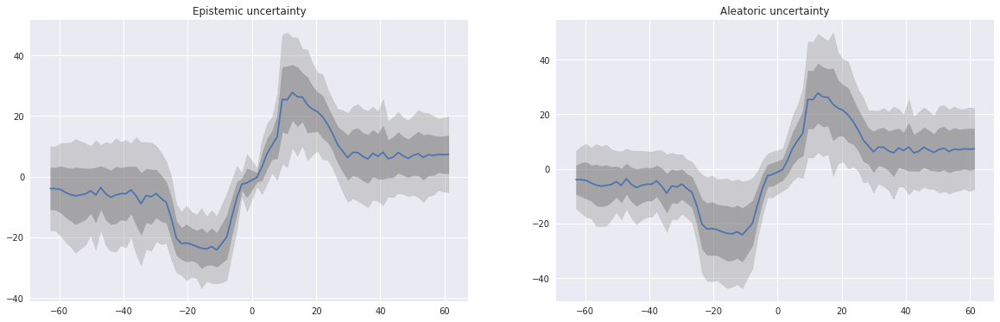

950000 th loss :tensor(62.5048)


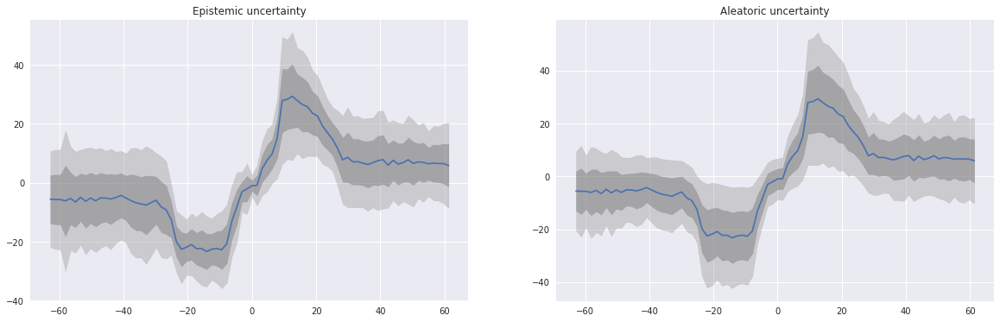

960000 th loss :tensor(105.8478)


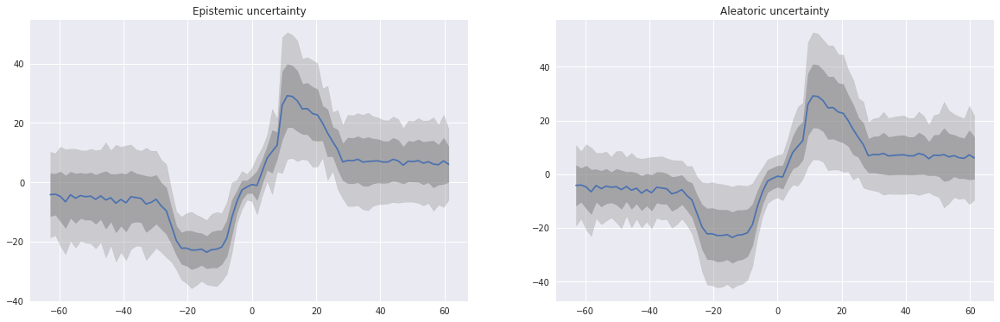

970000 th loss :tensor(49.4794)


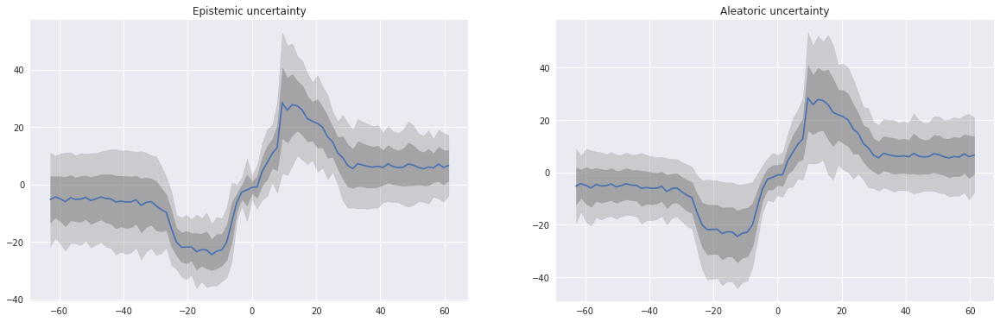

980000 th loss :tensor(86.4996)


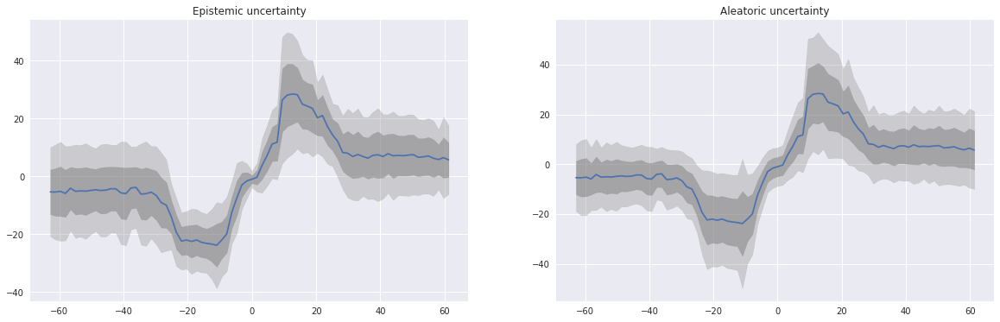

990000 th loss :tensor(20.0354)


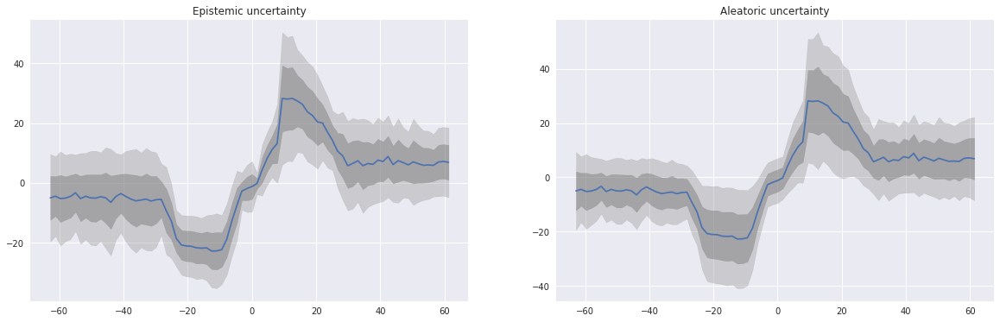

In [11]:
# Heteroscedastic data fitting with both MC dropout and estimate aleatoric uncertainty
hybrid_net = Net().cuda()
hybrid_opt = torch.optim.Adam(hybrid_net.parameters(),lr=1e-4)
hybrid_loss_func = nn.MSELoss(reduce=False)
hybrid_net.train()

for _ in range(10**6):
    # Sample the data with replacement
    index = np.random.choice(range(len(x)),size = 2**4)
    x_chosen = Variable(torch.FloatTensor(x[index]).view(-1,1)).cuda()
    y_chosen = Variable(torch.FloatTensor(y_hetero[index]).view(-1,1)).cuda()
    
    # Prdict and calculate the loss
    y_predict, y_uncertain = hybrid_net.forward(x_chosen, training = True)
    loss =((torch.exp(-y_uncertain)*hybrid_loss_func(y_predict, y_chosen) )+ y_uncertain).sum()
    loss_to_show = hybrid_loss_func(y_predict, y_chosen).mean()
    
    hybrid_opt.zero_grad()
    loss.backward()
    hybrid_opt.step()
    
    if (_%10**4) == 0:
        print(str(_)+' th loss :'+ str(loss_to_show.cpu().data[0]))
        
        x_test = np.array(range(-40,40))/2.*np.pi
        x_chosen = Variable(torch.FloatTensor(x_test).view(-1,1)).cuda()
        y_pred = np.zeros((100, 80,1))
        y_uncert = np.zeros((100, 80,1))

        for i in range(100):
            hybrid_net.eval()
            y_predict, y_uncertain = hybrid_net.forward(x_chosen, training = True)
            y_pred[i] = y_predict.cpu().data
            y_uncert[i] = y_uncertain.cpu().data

        y_pred_mean = y_pred.mean(axis = 0)
        y_pred_std = y_pred.std(axis = 0)
        y_uncert = np.sqrt(np.mean(np.exp(y_uncert), axis =0))
        
        f, (ax1, ax2) = plt.subplots(1, 2,figsize=(20,6))
        ax1.plot(x_test, y_pred_mean)
        ax1.fill_between(x_test, y_pred_mean.reshape(-1) - y_pred_std.reshape(-1), 
                         y_pred_mean.reshape(-1) + y_pred_std.reshape(-1),color='gray', alpha=0.5)
        ax1.fill_between(x_test, y_pred_mean.reshape(-1) - 2*y_pred_std.reshape(-1), 
                         y_pred_mean.reshape(-1) + 2*y_pred_std.reshape(-1),color='gray', alpha=0.3)
        ax2.plot(x_test, y_pred_mean)
        ax2.fill_between(x_test, y_pred_mean.reshape(-1) - y_uncert.reshape(-1), 
                         y_pred_mean.reshape(-1) +y_uncert.reshape(-1),color='gray', alpha=0.5)
        ax2.fill_between(x_test, y_pred_mean.reshape(-1) - 2*y_uncert.reshape(-1), 
                         y_pred_mean.reshape(-1) + 2*y_uncert.reshape(-1),color='gray', alpha=0.3)
        ax1.set_title('Epistemic uncertainty')
        ax2.set_title('Aleatoric uncertainty')
        plt.show()